In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
import time
import gget
import anndata as an
import scanpy as sc
import scanpy.external as sce
import h5py
import scipy
from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import cdist
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm
from matplotlib_venn import venn2, venn3, venn3_unweighted
import matplotlib.colors as mcolors
import matplotlib.patheffects as path_effects
import matplotlib.patches as patches


from scipy.spatial.distance import pdist, squareform
from collections import defaultdict

sc.settings.verbosity = 2

# Load in processed anndata

In [2]:
%%time
path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_all_groups_v2.h5ad"
adata = sc.read_h5ad(path)
sc.logging.print_memory_usage()
adata

Memory usage: current 2.42 GB, difference +2.42 GB
CPU times: user 449 ms, sys: 2.07 s, total: 2.52 s
Wall time: 4.2 s


/nfs/turbo/umms-indikar/Jillian/conda-envs/rapids/lib/python3.13/site-packages/anndata/logging.py:57: FutureWarning: The specified parameters ('newline',) are no longer positional. Please specify them like `newline=False`
  print(format_memory_usage(get_memory_usage(), msg, newline))


AnnData object with n_obs × n_vars = 16296 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'mean', 'st

In [3]:
%%time
regev_genes = [x.strip() for x in open('../../resources/regev_lab_cell_cycle_genes.txt')]
# regev_genes = [g for g in regev_genes if g in adata.var_names]

s_genes = regev_genes[:43]
g2m_genes = regev_genes[43:]

adata.X = adata.layers['log_norm'].copy()

sc.tl.score_genes_cell_cycle(
    adata,
    s_genes=s_genes,
    g2m_genes=g2m_genes,
)

adata.obs[['phase']].head()

calculating cell cycle phase
computing score 'S_score'
    finished (0:00:01)
computing score 'G2M_score'
    finished (0:00:01)
CPU times: user 1.68 s, sys: 1.41 s, total: 3.09 s
Wall time: 3.13 s


,phase
AAACCAAAGCAACTGC_hybrid,G2M
AAACCAAAGTAGGGCA_hybrid,S
AAACCAAAGTCTAGGC_hybrid,G1
AAACCATTCACGTAAT_hybrid,G2M
AAACCATTCAGGCAGA_hybrid,G2M


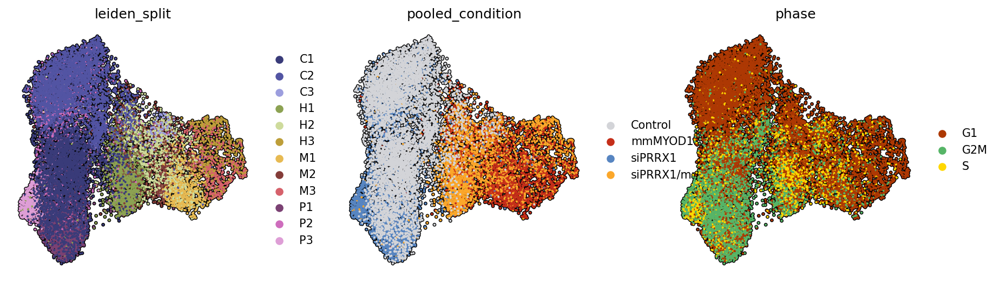

In [4]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['leiden_split', 'pooled_condition', 'phase'],
    size=15,
    ncols=3,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

# Load gene sets

In [5]:
# HALLMARK myogenesis
mdf = pd.read_json("../../resources/HALLMARK_MYOGENESIS.v2026.1.Hs.json")
myo_genes = mdf.loc['geneSymbols', 'HALLMARK_MYOGENESIS']
print(f'Total HALLMARK_MYOGENESIS genes: {len(myo_genes)}')

print(", ".join(sorted(myo_genes)))

Total HALLMARK_MYOGENESIS genes: 200
ABLIM1, ACHE, ACSL1, ACTA1, ACTC1, ACTN2, ACTN3, ADAM12, ADCY9, AEBP1, AGL, AGRN, AK1, AKT2, ANKRD2, APLNR, APOD, APP, ATP2A1, ATP6AP1, BAG1, BDKRB2, BHLHE40, BIN1, CACNA1H, CACNG1, CAMK2B, CASQ1, CASQ2, CAV3, CD36, CDH13, CDKN1A, CFD, CHRNA1, CHRNB1, CHRNG, CKB, CKM, CKMT2, CLU, CNN3, COL15A1, COL1A1, COL3A1, COL4A2, COL6A2, COL6A3, COX6A2, COX7A1, CRAT, CRYAB, CSRP3, CTF1, DAPK2, DENND2B, DES, DMD, DMPK, DTNA, EFS, EIF4A2, ENO3, EPHB3, ERBB3, FABP3, FDPS, FGF2, FHL1, FKBP1B, FLII, FOXO4, FST, FXYD1, GAA, GABARAPL2, GADD45B, GJA5, GNAO1, GPX3, GSN, HBEGF, HDAC5, HRC, HSPB2, HSPB8, IFRD1, IGF1, IGFBP3, IGFBP7, ITGA7, ITGB1, ITGB4, ITGB5, KCNH1, KCNH2, KIFC3, KLF5, LAMA2, LARGE1, LDB3, LPIN1, LSP1, MAPK12, MAPRE3, MB, MEF2A, MEF2C, MEF2D, MRAS, MYBPC3, MYBPH, MYF6, MYH1, MYH11, MYH2, MYH3, MYH4, MYH7, MYH8, MYH9, MYL1, MYL11, MYL2, MYL3, MYL4, MYL6B, MYL7, MYLK, MYO1C, MYOG, MYOM1, MYOM2, MYOZ1, NAV2, NCAM1, NOS1, NOTCH1, NQO1, OCEL1, PC, PDE4DIP, PD

In [6]:
### GO biological processes
path_2023 = "../resources/GO_Biological_Process_2023.txt"
path_2025 = "/home/jrcwycy/.cache/gseapy/Enrichr.GO_Biological_Process_2025.gmt"

geneset_dict = {}

with open(path_2025, "r") as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) >= 1:
            term = parts[0].strip()
            genes = parts[2:] if len(parts) > 2 else []
            genes = [g.strip() for g in genes if g.strip()]
            geneset_dict[term] = genes

geneset = pd.DataFrame.from_dict(geneset_dict, orient='index').T
geneset.head()

,'De Novo' AMP Biosynthetic Process (GO:0044208),'De Novo' Post-Translational Protein Folding (GO:0051084),2-Oxoglutarate Metabolic Process (GO:0006103),3'-UTR-mediated mRNA Destabilization (GO:0061158),3'-UTR-mediated mRNA Stabilization (GO:0070935),3'-Phosphoadenosine 5'-Phosphosulfate Metabolic Process (GO:0050427),4-Hydroxyproline Metabolic Process (GO:0019471),5S Class rRNA Transcription by RNA Polymerase III (GO:0042791),7-Methylguanosine RNA Capping (GO:0009452),7-Methylguanosine Cap Hypermethylation (GO:0036261),...,Wybutosine Biosynthetic Process (GO:0031591),Wybutosine Metabolic Process (GO:0031590),Xenobiotic Catabolic Process (GO:0042178),Xenobiotic Transport (GO:0042908),Xenobiotic Transport Across Blood-Brain Barrier (GO:1990962),Zinc Ion Import Across Plasma Membrane (GO:0071578),Zinc Ion Import Into Organelle (GO:0062111),Zinc Ion Transmembrane Transport (GO:0071577),Zinc Ion Transport (GO:0006829),Zymogen Activation (GO:0031638)
0,ATIC,CCT4,IDH1,UPF1,RBM38,PAPSS1,EGLN2,GTF3C2,RNGTT,SNRPD3,...,TYW5,TYW5,UGT1A10,ABCC5,ABCC2,SLC30A8,SLC30A8,SLC30A8,SLC30A8,FGB
1,PAICS,SDF2L1,PHYH,TRIM71,DAZ4,PAPSS2,GOT2,GTF3C3,RNMT,SNRPD2,...,TYW3,TYW3,GSTM4,SLC22A4,SLC22A1,SLC39A10,SLC30A7,SLC39A1,SLC39A1,FGG
2,PFAS,CCT3,GOT2,RC3H1,TIRAP,SULT1A2,HOGA1,GTF3C4,NCBP1,SNRPF,...,TYW1,TYW1,GSTM3,ABCB1,SLC22A2,SLC39A12,SLC30A4,SLC30A4,SLC30A9,F12
3,ADSS1,HSPA9,IDH2,ZFP36L1,DAZ3,SULT1C4,P4HB,GTF3C5,CMTR2,SNRPG,...,TRMT12,TRMT12,GSTM2,ABCC2,ABCC1,SLC39A6,SLC30A3,SLC30A3,SLC30A4,ZNF160
4,ADSS2,CCT2,ADHFE1,PUM2,YBX3,SULT2A1,PRODH,GTF3C6,RAMAC,SNRPE,...,TYW1B,TYW1B,NANOS1,SLC15A2,ABCG2,SLC39A14,SLC30A6,SLC30A5,SLC30A3,F9


In [7]:
[col for col in geneset if 'apoptosis' in col.lower()]

['Negative Regulation of Execution Phase of Apoptosis (GO:1900118)',
 'Positive Regulation of Execution Phase of Apoptosis (GO:1900119)',
 'Regulation of Execution Phase of Apoptosis (GO:1900117)']

In [8]:
[col for col in geneset if 'skeletal muscle' in col.lower()]

['Negative Regulation of Skeletal Muscle Cell Differentiation (GO:2001015)',
 'Positive Regulation of Skeletal Muscle Cell Differentiation (GO:2001016)',
 'Positive Regulation of Skeletal Muscle Tissue Development (GO:0048643)',
 'Regulation of Skeletal Muscle Cell Differentiation (GO:2001014)',
 'Regulation of Skeletal Muscle Contraction (GO:0014819)',
 'Regulation of Skeletal Muscle Fiber Development (GO:0048742)',
 'Regulation of Skeletal Muscle Satellite Cell Proliferation (GO:0014842)',
 'Skeletal Muscle Cell Differentiation (GO:0035914)',
 'Skeletal Muscle Contraction (GO:0003009)',
 'Skeletal Muscle Fiber Development (GO:0048741)',
 'Skeletal Muscle Organ Development (GO:0060538)',
 'Skeletal Muscle Thin Filament Assembly (GO:0030240)',
 'Skeletal Muscle Tissue Development (GO:0007519)',
 'Skeletal Muscle Tissue Regeneration (GO:0043403)']

In [9]:
# cols_to_keep = [
#     'Positive Regulation of Skeletal Muscle Cell Differentiation (GO:2001016)',
#     'Positive Regulation of Skeletal Muscle Tissue Development (GO:0048643)',
#     'Regulation of Skeletal Muscle Cell Differentiation (GO:2001014)',
#     'Skeletal Muscle Cell Differentiation (GO:0035914)',
#     'Skeletal Muscle Organ Development (GO:0060538)',
# ]

cols_to_keep = [col for col in geneset if 'skeletal muscle' in col.lower()]

skel_mus_genes = list(set(geneset[cols_to_keep].stack().tolist()))
print(f'N skeletal muscle genes: {len(skel_mus_genes)}')
print(", ".join(sorted(skel_mus_genes)))

N skeletal muscle genes: 98
ACTC1, ANGPT1, ANHX, CAV1, CAV2, CAV3, CFLAR, CHRNA1, CSRP3, DDX17, DDX5, DES, DISP1, DLL1, DMD, DMPK, EGR2, EPHB1, EYS, FGF13, FLOT1, FOXL2, FXR1, GPC1, HDAC9, HDGFL2, IGSF8, JSRP1, KAT8, KCNJ2, KLHL40, KLHL41, LARGE1, LEMD2, LMOD3, MCUB, MEF2C, MEGF10, MSTN, MYF5, MYF6, MYH14, MYH3, MYH7, MYH8, MYL11, MYL6, MYL6B, MYLK2, MYMX, MYOCD, MYOD1, MYOG, MYORG, MYOZ1, MYOZ2, NACA, NR1D2, PAX7, POPDC1, POPDC2, POPDC3, PPP3CA, PPP3CB, PROX1, PVALEF, RBM24, RCSD1, RYR1, SCN4A, SELENON, SIRT2, SIX1, SIX4, SKI, SKIL, SLC25A37, SLC8A3, STAC, STAC2, STAC3, STRA6, SVIL, TCAP, TCF21, TMEM182, TNNC2, TNNI1, TNNI2, TNNI3, TNNT1, TNNT3, TTR, UQCC2, VRK3, WT1, XIRP1, ZBTB18


In [10]:
fpath = "../../resources/genes_for_scoring.csv"

df = pd.read_csv(fpath)
print(df.shape)
print(df.columns.tolist())
df.head()

qui_tfs = df['quiescence'].unique()
print(f"\nN quiescence TFs: {len(qui_tfs)}")

(512, 18)
['G1/S_transition', 'G2/M_transition', 'CC_checkpoints', 'Cell_cycle_reg', 'Pos_proliferation', 'Neg_proliferation', 'quiescence', 'AS', 'Chromatin', 'Circadian', 'Core_repro', 'NOTCH_signaling', 'Asymm_PCP', 'FOXO', 'p53_acyivity', 'DREAM/negE2F', 'senes_stress', 'sasp']

N quiescence TFs: 60


In [11]:
sasp_genes = df['sasp'].unique()
print(len(sasp_genes))

82


In [12]:
sdf = pd.read_csv("../../resources/CellAge_senescence_signature.csv")
print(sdf.shape)
sdf.head()

sen_over = sdf[sdf['Expression'] == 'Over-expressed']['Symbol'].unique()
print(f'N over-expressed senescence genes: {len(sen_over)}')

sen_under = sdf[sdf['Expression'] == 'Under-expressed']['Symbol'].unique()
print(f'N under-expressed senescence genes: {len(sen_under)}')

(1259, 5)
N over-expressed senescence genes: 525
N under-expressed senescence genes: 734


In [13]:
fpath = "../../resources/quiescence_markers.csv"

qdf = pd.read_csv(fpath)
print(qdf.shape)
qdf.head()

print(qdf['source'].value_counts())

# remove these genes because specific to stem cell quiescence ? 
qdf = qdf[qdf['source'] != 'Cheung_down']
qdf = qdf[qdf['source'] != 'Cheung_up']

qdf_up = qdf[qdf['source'].str.endswith('_up')]
qui_up_genes = qdf_up['gene'].unique()
print(f"\nN genes UP in quiescence: {len(qui_up_genes)}")

qdf_down = qdf[qdf['source'].str.endswith('_down')]
qui_down_genes = qdf_down['gene'].unique()
print(f"N genes DOWN in quiescence: {len(qui_down_genes)}")

(198, 2)
source
Coller_up      87
Cheung_up      38
G1_to_G0_up    30
Coller_down    24
Cheung_down    19
Name: count, dtype: int64

N genes UP in quiescence: 115
N genes DOWN in quiescence: 24


# mmMYOD1

In [14]:
# subset mmMYOD1 G1 cells
mdata = adata[adata.obs['pooled_condition'].isin(['mmMYOD1']), :].copy()
mdata

AnnData object with n_obs × n_vars = 2255 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'mean', 'std

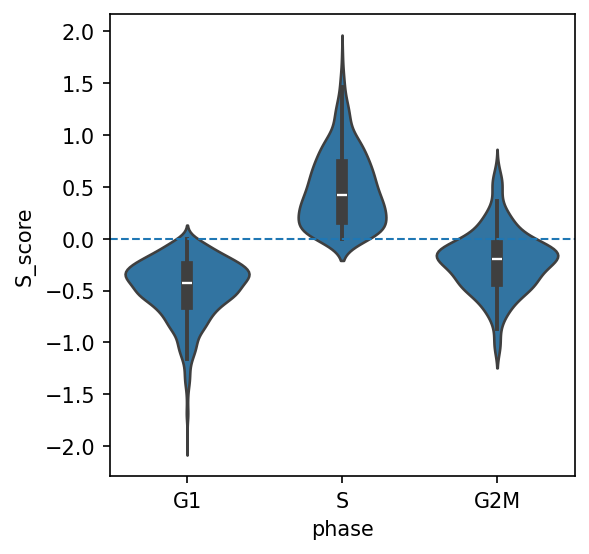

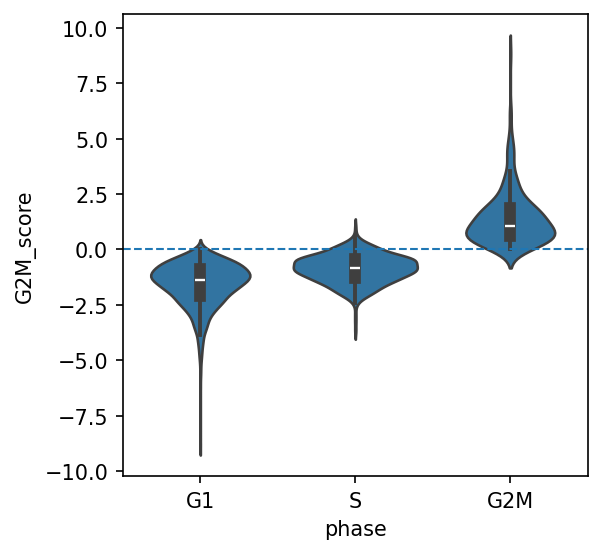

In [15]:
sns.violinplot(
    data=mdata.obs,
    x='phase',
    y='S_score',
    order=['G1', 'S', 'G2M']
)
plt.axhline(y=0, ls='--', lw=1)
plt.show()

sns.violinplot(
    data=mdata.obs,
    x='phase',
    y='G2M_score',
    order=['G1', 'S', 'G2M']
)
plt.axhline(y=0, ls='--', lw=1)
plt.show()

## Gene scores

84
computing score 'skel_mus_score'
    finished (0:00:00)


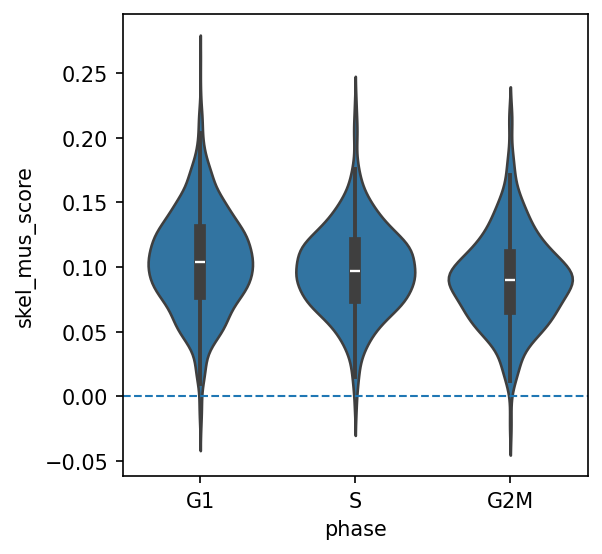

In [29]:
skel_mus_genes1 = [g for g in skel_mus_genes if g in mdata.var_names]
print(len(skel_mus_genes1))

sc.tl.score_genes(
    mdata,
    gene_list=skel_mus_genes1,
    score_name='skel_mus_score',
    ctrl_size=500,
    use_raw=False,
    layer='log_norm',
)


sns.violinplot(
    data=mdata.obs,
    x='phase',
    y='skel_mus_score',
    order=['G1', 'S', 'G2M']
)
plt.axhline(y=0, ls='--', lw=1)
plt.show()

172
computing score 'myogenesis_score'
    finished (0:00:00)


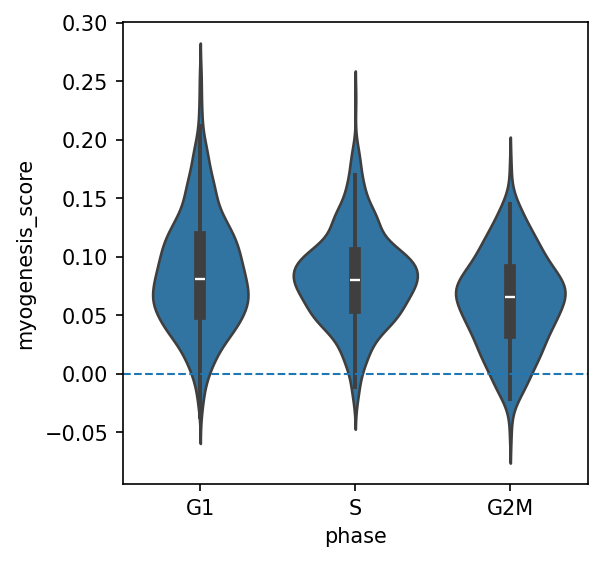

In [30]:
myo_genes1 = [g for g in myo_genes if g in mdata.var_names]
print(len(myo_genes1))

sc.tl.score_genes(
    mdata,
    gene_list=myo_genes1,
    score_name='myogenesis_score',
    ctrl_size=500,
    use_raw=False,
    layer='log_norm',
)


sns.violinplot(
    data=mdata.obs,
    x='phase',
    y='myogenesis_score',
    order=['G1', 'S', 'G2M']
)
plt.axhline(y=0, ls='--', lw=1)
plt.show()

computing score 'qui_TFs_score'
    finished (0:00:00)
computing score 'qui_genes_score'
    finished (0:00:00)
computing score 'qui_down_score'
    finished (0:00:00)


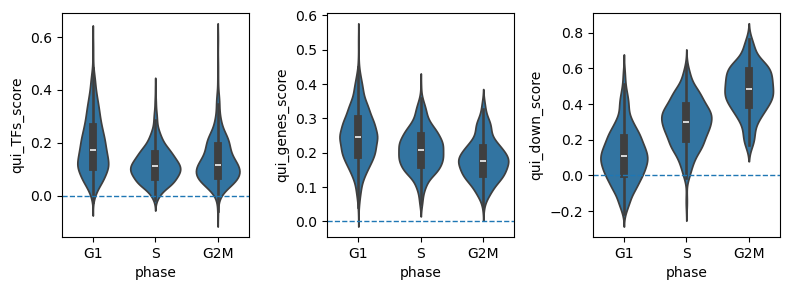

In [31]:
sc.tl.score_genes(
    mdata,
    gene_list=qui_tfs,
    score_name='qui_TFs_score',
    ctrl_size=500,
    use_raw=False,
    layer='log_norm',
)

sc.tl.score_genes(
    mdata,
    gene_list=qui_up_genes,
    score_name='qui_genes_score',
    ctrl_size=500,
    use_raw=False,
    layer='log_norm',
)

sc.tl.score_genes(
    mdata,
    gene_list=qui_down_genes,
    score_name='qui_down_score',
    ctrl_size=500,
    use_raw=False,
    layer='log_norm',
)

scores_to_plot = ['qui_TFs_score', 'qui_genes_score', 'qui_down_score']

fig, axes = plt.subplots(1, 3, figsize=(8, 3), dpi=100)

for i, score in enumerate(scores_to_plot):
    ax = axes[i]
    
    sns.violinplot(
        data=mdata.obs,
        x='phase',
        y=score,
        order=['G1', 'S', 'G2M'],
        ax=ax,
    )
    
    ax.axhline(y=0, ls='--', lw=1)

plt.tight_layout()
plt.show()

## Embedding

extracting highly variable genes
Number of HVG: 2000


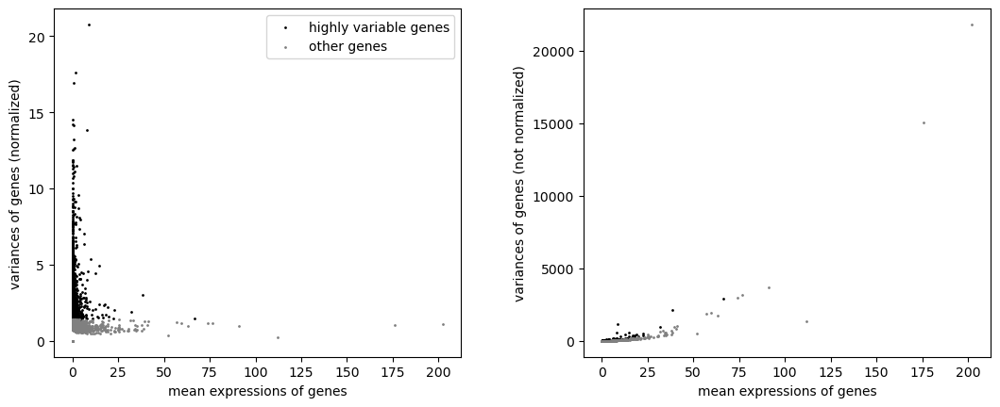

computing PCA
    with n_comps=50
    finished (0:00:00)


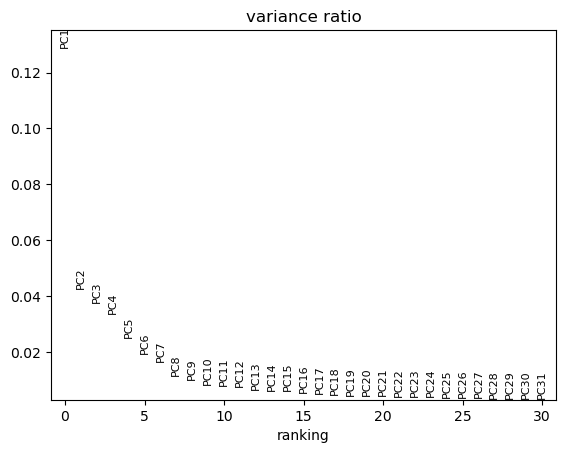

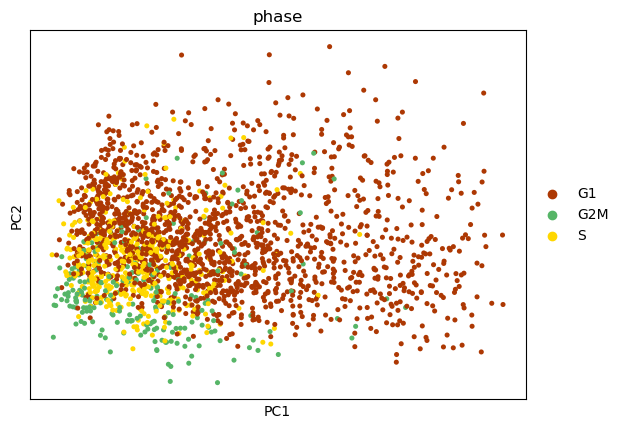

AnnData object with n_obs × n_vars = 2255 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'mean', 'std

In [16]:
mdata.X = mdata.layers['raw_counts'].copy()

sc.pp.highly_variable_genes(
    mdata,
    flavor='seurat_v3',
)

print(f"Number of HVG: {mdata.var['highly_variable'].sum()}")

plt.rcdefaults()
sc.pl.highly_variable_genes(mdata)


mdata.X = mdata.layers['log_norm'].copy()

sc.pp.pca(mdata)
sc.pl.pca_variance_ratio(mdata)

sc.pl.pca(
    mdata, 
    color='phase',
)

mdata

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:05)
computing UMAP
    finished (0:00:04)
running Leiden clustering
    finished (0:00:00)


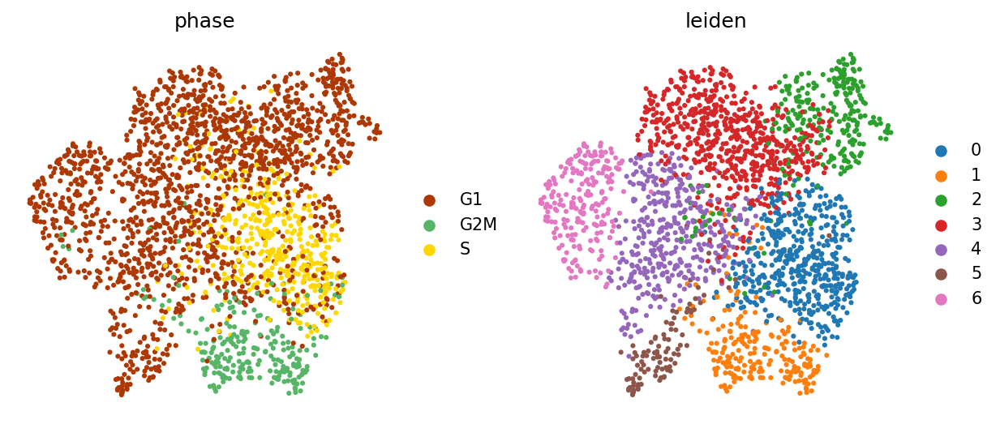

In [17]:
sc.pp.neighbors(
    mdata,
    n_neighbors=10,
)

sc.tl.umap(
    mdata,
)

sc.tl.leiden(
    mdata,
    resolution=0.5,
    flavor='igraph',
)

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    mdata,
    color=['phase', 'leiden'],
    size=35,
    ncols=2,
    # add_outline=True,
    # outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

In [18]:
mdata.obs['cluster_str'] = mdata.obs['leiden'].apply(lambda x: f"C{str(int(x) + 1)}")

mdata.obs['cluster_str'].value_counts()

cluster_str
C4    615
C1    454
C5    389
C3    267
C7    217
C2    213
C6    100
Name: count, dtype: int64

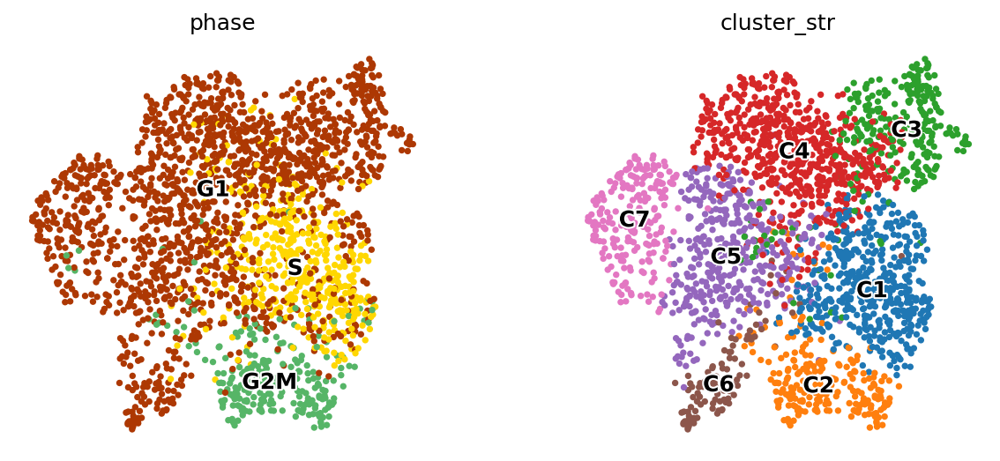

In [26]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    mdata,
    color=['phase', 'cluster_str'],
    size=50,
    ncols=2,
    # add_outline=True,
    # outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
    legend_loc='on data',
    na_in_legend=False,
    legend_fontoutline=2,
    legend_fontsize='large',
)

## MYOD1 expression

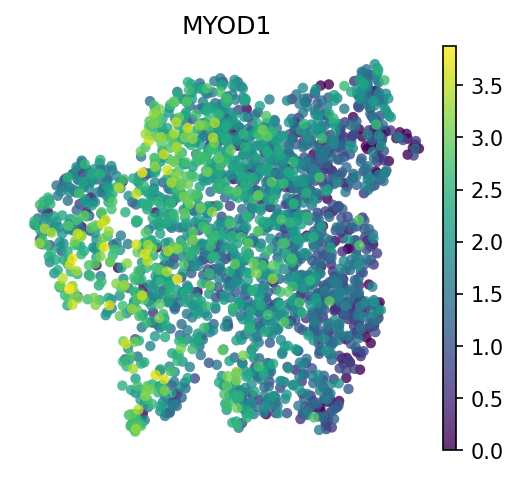

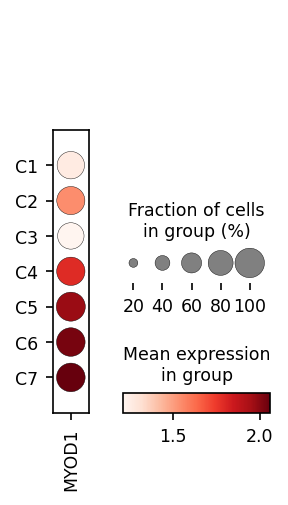

In [25]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 3.5

sc.pl.umap(
    mdata,
    color='MYOD1',
    size=100,
    ncols=4,
    # add_outline=True,
    # outline_color=('k', 'k'),
    frameon=False,
    alpha=0.8,
    layer='log_norm',
)

sc.pl.dotplot(
    mdata,
    var_names='MYOD1',
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='',
    # standard_scale='var',
)

## Gene scores vis

In [27]:
sc.tl.score_genes(
    mdata,
    gene_list=sasp_genes,
    score_name='sasp_score',
    ctrl_size=500,
    use_raw=False,
    layer='log_norm',
)

computing score 'sasp_score'
    finished (0:00:00)


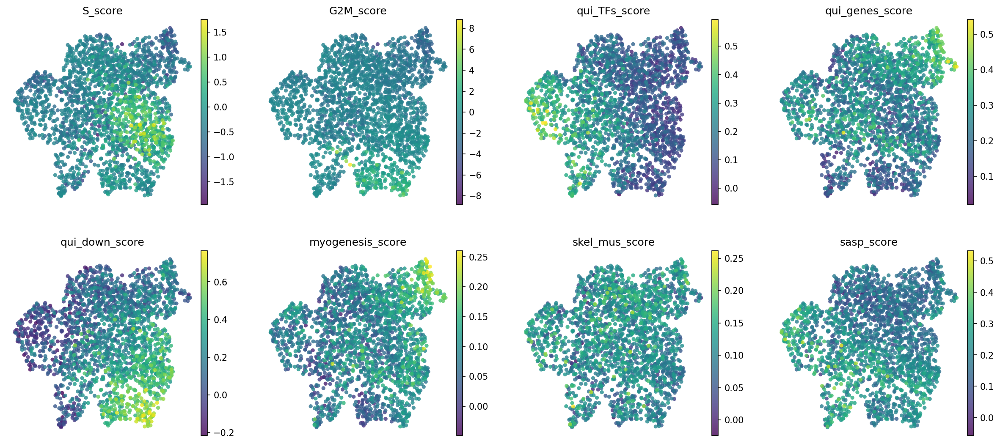

In [32]:
scores_to_plot = ['S_score', 'G2M_score', 'qui_TFs_score', 'qui_genes_score', 'qui_down_score', 'myogenesis_score', 'skel_mus_score', 'sasp_score']

sc.pl.umap(
    mdata,
    color=scores_to_plot,
    size=80,
    ncols=4,
    # add_outline=True,
    # outline_color=('k', 'k'),
    frameon=False,
    alpha=0.8,
)

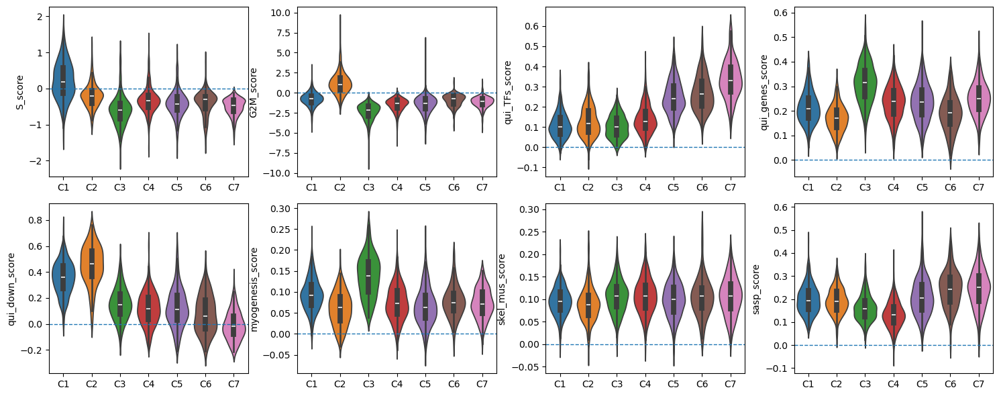

In [33]:
scores_to_plot = ['S_score', 'G2M_score', 'qui_TFs_score', 'qui_genes_score', 'qui_down_score', 'myogenesis_score', 'skel_mus_score', 'sasp_score']

fig, axes = plt.subplots(2, 4, figsize=(15, 6), dpi=100)
axes = axes.flatten()

for i, score in enumerate(scores_to_plot):
    ax = axes[i]
    
    sns.violinplot(
        data=mdata.obs,
        x='cluster_str',
        y=score,
        hue='cluster_str',
        order=sorted(mdata.obs['cluster_str'].unique()),
        palette=mdata.uns['cluster_str_colors'],#'Set2',
        legend=False,
        ax=ax,
    )
    
    ax.axhline(y=0, ls='--', lw=1)
    ax.set_xlabel('')

plt.tight_layout()
plt.show()

C1 - proliferating (S), high qui_down_score
C2 - proliferating (G2M), high qui_down_score

C3 - high qui_genes_score, high myogenesis_score



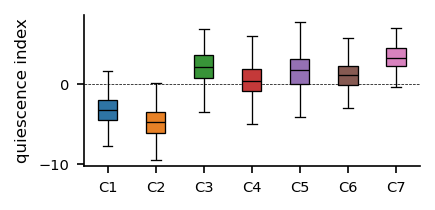

In [34]:
## quiescence index

qdf = mdata.obs[['cluster_str', 'S_score', 'G2M_score', 'qui_TFs_score', 'qui_genes_score', 'qui_down_score']].copy()

score_cols = qdf.columns[-5:]


# z-score normalize each score across all cells
for col in score_cols:
    mean = qdf[col].mean()
    std = qdf[col].std()
    qdf[col + '_z'] = (qdf[col] - mean) / std

# compute quiescence index per cell
qdf['QI_cell'] = (
    qdf['qui_TFs_score_z'] +
    qdf['qui_genes_score_z'] -
    qdf['qui_down_score_z'] -
    qdf['S_score_z'] -
    qdf['G2M_score_z']
)

qdf.head()

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 3, 1.5

# cond_order = qi_cluster.index.tolist()

sns.boxplot(
    data=qdf,
    x='cluster_str',
    hue='cluster_str',
    # order=cond_order,
    y='QI_cell',
    width=0.4,
    linecolor='k',
    linewidth=0.63,
    palette=mdata.uns['cluster_str_colors'],
    legend=False,
    saturation=0.8,
    showfliers=False,
    # flierprops={'markersize': 0.5, 'alpha': 0.5},
    zorder=1,
)

plt.axhline(0, linestyle='--', linewidth=0.35, color='k', zorder=0)

plt.ylabel('quiescence index', fontsize=8)
plt.xticks(fontsize=7)#, rotation=90)
plt.yticks(fontsize=7)
plt.xlabel("")

sns.despine()
plt.tight_layout()
plt.show() 

## GEX

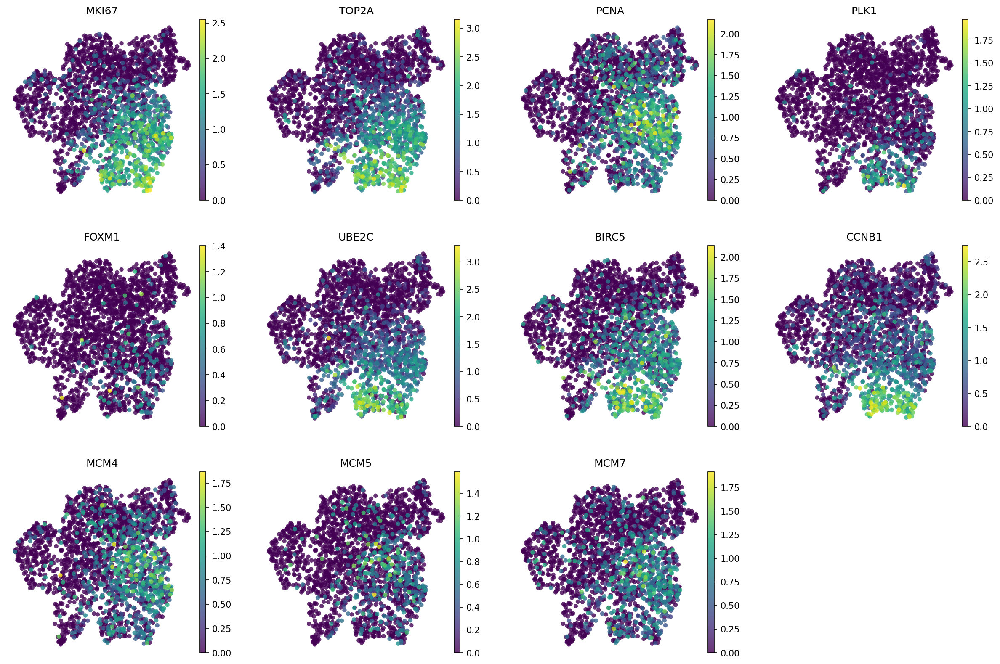

In [50]:
prolif_genes = [
    'MKI67', 'TOP2A', 'PCNA', 'PLK1', 'FOXM1', 'UBE2C', 'BIRC5', 'CCNB1', 'MCM4', 'MCM5', 'MCM7',
]

prolif_genes = [g for g in prolif_genes if g in mdata.var_names]

sc.pl.umap(
    mdata,
    color=prolif_genes,
    size=100,
    ncols=4,
    # add_outline=True,
    # outline_color=('k', 'k'),
    frameon=False,
    alpha=0.8,
    layer='log_norm',
)

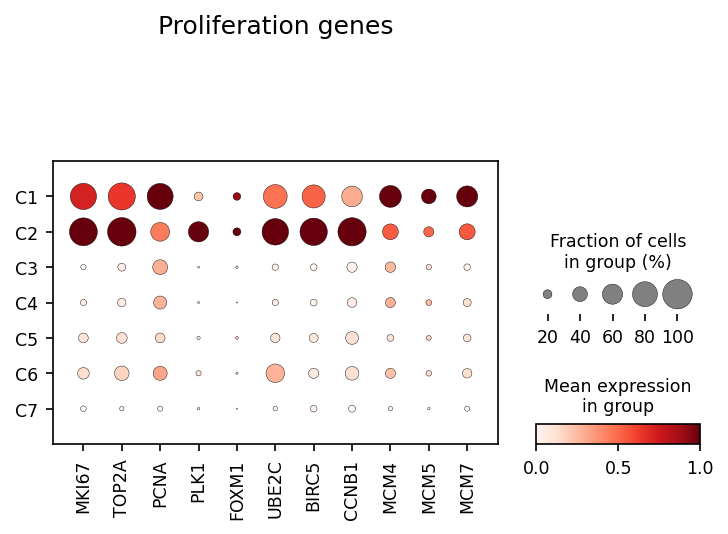

In [104]:
prolif_genes = [
    'MKI67', 'TOP2A', 'PCNA', 'PLK1', 'FOXM1', 'UBE2C', 'BIRC5', 'CCNB1', 'MCM4', 'MCM5', 'MCM7',
]

prolif_genes = [g for g in prolif_genes if g in mdata.var_names]

sc.pl.dotplot(
    mdata,
    var_names=prolif_genes,
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='Proliferation genes',
    standard_scale='var',
)

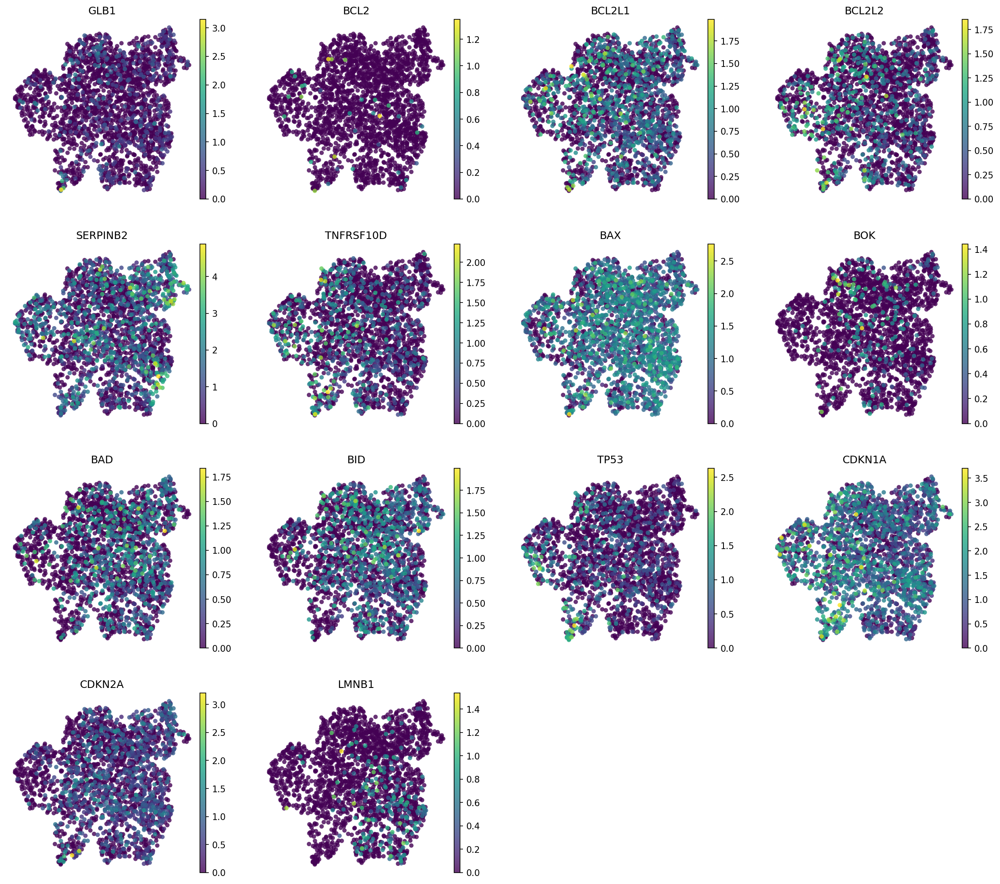

In [63]:
senes_genes = [
    'GLB1', # gene encoding beta-galactosidase
    'BCL2', 'BCL2L1', 'BCL2L2', 'SERPINB2', 'TNFRSF10D', # apop resistance (should be UP)
    'BAX', 'BAK', 'BOK', 'BCLX', 'BAD', 'BID', 'BIM', 'TP53', 'PUMA', # pro-apoptotic (should be DOWN)
    'CDKN1A', 'CDKN2A', # cell cycle arrest (CDKN1A is also apop resistance)
    'LMNB1', # negative marker (senes cells often have reduced lamin B1)
]

senes_genes = [g for g in senes_genes if g in mdata.var_names]

sc.pl.umap(
    mdata,
    color=senes_genes,
    size=100,
    ncols=4,
    # add_outline=True,
    # outline_color=('k', 'k'),
    frameon=False,
    alpha=0.8,
    layer='log_norm',
)

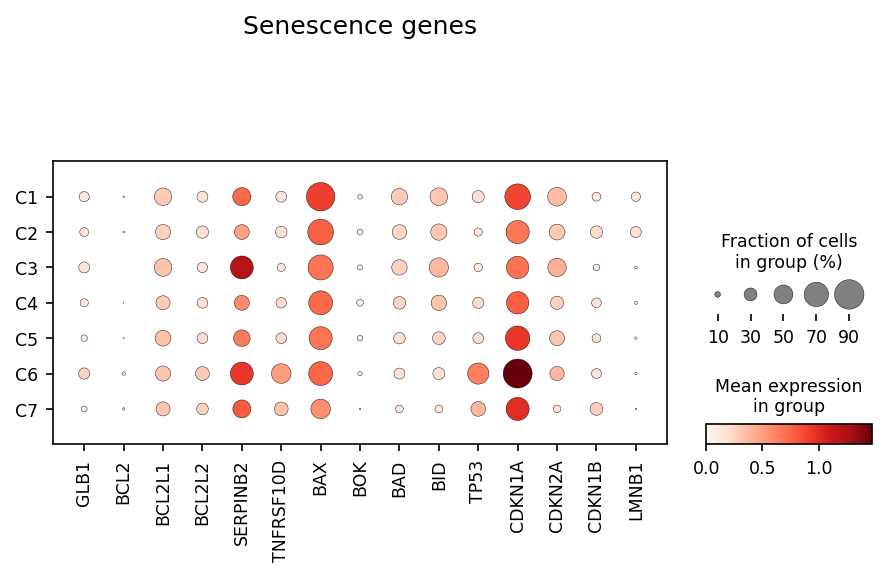

In [109]:
senes_genes = [
    'GLB1', # gene encoding beta-galactosidase
    'BCL2', 'BCL2L1', 'BCL2L2', 'SERPINB2', 'TNFRSF10D', # apop resistance (should be UP)
    'BAX', 'BAK', 'BOK', 'BCLX', 'BAD', 'BID', 'BIM', 'TP53', 'PUMA', # pro-apoptotic (should be DOWN)
    'CDKN1A', 'CDKN2A', 'CDKN1B', # cell cycle arrest (CDKN1A is also apop resistance)
    'LMNB1', # negative marker (senes cells often have reduced lamin B1)
]

senes_genes = [g for g in senes_genes if g in mdata.var_names]

sc.pl.dotplot(
    mdata,
    var_names=senes_genes,
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='Senescence genes',
    # standard_scale='var',
)

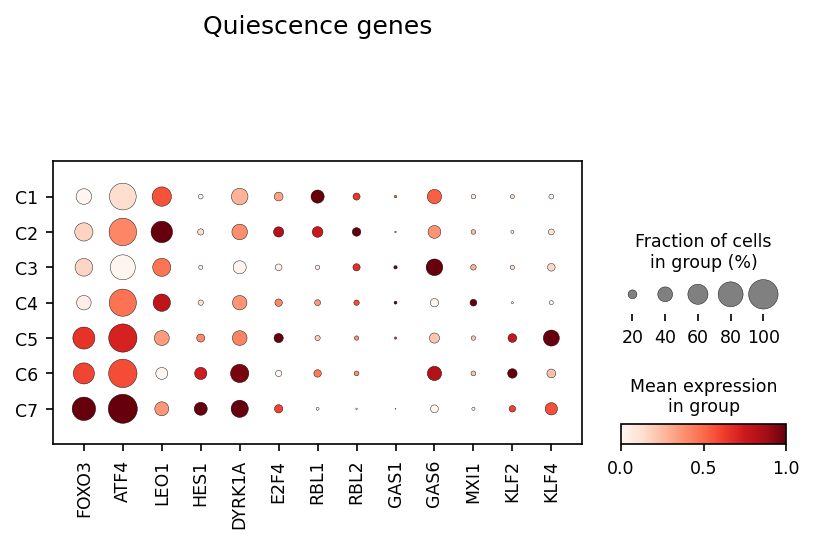

In [117]:
quiesence_genes = [
    'FOXO3', 'ATF4', 'LEO1', 'HES1', 'DYRK1A', 'E2F4', 'RBL1', 'RBL2',
    'GAS1', 'GAS6', 'MXI1', 'KLF2', 'KLF4',
]

quiesence_genes = [g for g in quiesence_genes if g in mdata.var_names]

sc.pl.dotplot(
    mdata,
    var_names=quiesence_genes,
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='Quiescence genes',
    standard_scale='var',
)

In [172]:
print(", ".join(sorted(myo_genes1)))

ABLIM1, ACHE, ACSL1, ACTA1, ACTC1, ACTN2, ADAM12, ADCY9, AEBP1, AGL, AGRN, AK1, AKT2, ANKRD2, APOD, APP, ATP2A1, ATP6AP1, BAG1, BDKRB2, BHLHE40, BIN1, CAMK2B, CASQ1, CAV3, CD36, CDH13, CDKN1A, CFD, CHRNA1, CHRNB1, CKB, CKM, CKMT2, CLU, CNN3, COL15A1, COL1A1, COL3A1, COL4A2, COL6A2, COL6A3, COX7A1, CRAT, CRYAB, CTF1, DAPK2, DENND2B, DES, DMD, DMPK, DTNA, EFS, EIF4A2, ENO3, EPHB3, ERBB3, FABP3, FDPS, FGF2, FHL1, FKBP1B, FLII, FOXO4, FST, FXYD1, GAA, GABARAPL2, GADD45B, GJA5, GNAO1, GPX3, GSN, HBEGF, HDAC5, HRC, HSPB2, HSPB8, IFRD1, IGF1, IGFBP3, IGFBP7, ITGA7, ITGB1, ITGB4, ITGB5, KCNH1, KIFC3, KLF5, LAMA2, LARGE1, LDB3, LPIN1, MAPK12, MAPRE3, MB, MEF2A, MEF2C, MEF2D, MRAS, MYBPC3, MYF6, MYH11, MYH2, MYH3, MYH9, MYL11, MYL3, MYL4, MYL6B, MYLK, MYO1C, MYOM1, MYOM2, MYOZ1, NAV2, NCAM1, NOS1, NOTCH1, NQO1, OCEL1, PC, PDE4DIP, PDLIM7, PFKM, PICK1, PKIA, PLXNB2, PPFIA4, PPP1R3C, PRNP, PSEN2, PTGIS, PTP4A3, PYGM, RB1, RIT1, RYR1, SCD, SCHIP1, SGCA, SGCD, SGCG, SH2B1, SH3BGR, SIRT2, SLC6A8, SMT

In [183]:
len(myo_genes1)

172

['MYOD1', 'MYF6', 'MYH2', 'MYH3', 'MYH9', 'DES', 'TTN', 'DMD', 'MYLK', 'ACTC1', 'ACTN2', 'SIX1', 'MEF2A', 'MEF2C', 'PAX7', 'PAX3', 'NCAM1', 'TNNT1', 'TNNT2', 'ENO3', 'CKM', 'FOXO4']


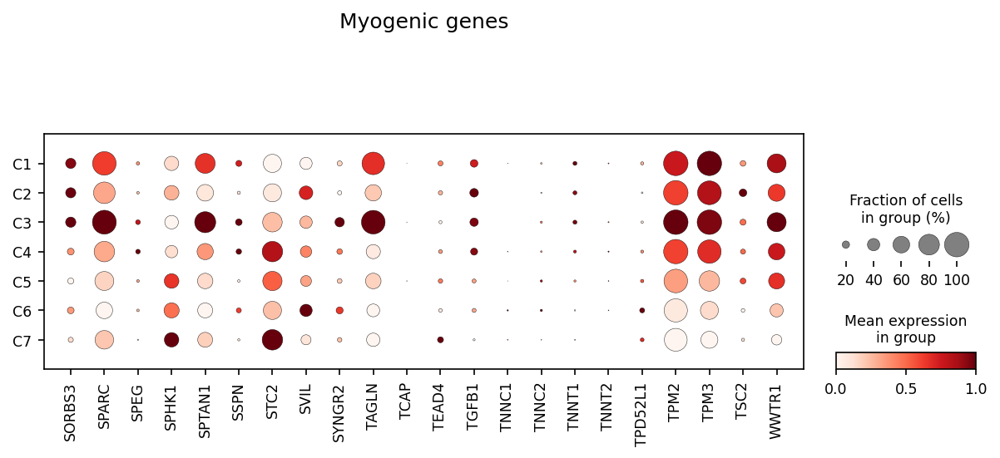

In [190]:
genes_to_plot = [
    'MYOD1', 'MYOG', 'MYF5', 'MYF6', 'MYH1', 'MYH2', 'MYH3', 'MYH7', 'MYH8', 'MYH9', 'DES', 'TTN', 'DMD', 'MYLK',
    'TNN2', 'ACTC1', 'ACTN2', 'SIX1', 'MEF2A', 'MEF2C', 'PAX7', 'PAX3', 'NCAM1',
    'TNNT1', 'TNNT3', 'TNNT2', 'ENO3', 'CKM', 'FOXO4',
]

genes_to_plot = [g for g in genes_to_plot if g in mdata.var_names]
print(genes_to_plot)

sc.pl.dotplot(
    mdata,
    var_names=myo_genes1[150:],
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='Myogenic genes',
    standard_scale='var',
)

## CCND1 vs p21

In [64]:
mdata.X = mdata.layers['log_norm'].copy()


genes = ['CCND1', 'CDKN1A']

mdata1 = mdata[:, genes].copy()
print(mdata1.shape)


X = mdata1.X if isinstance(mdata1.X, np.ndarray) else mdata1.X.toarray()

df = pd.DataFrame(
        X,
        index=mdata1.obs_names,
        columns=mdata1.var_names,
    )


df = df.reset_index(names='cell_id')
print(df.shape)
df.head()


tmp = mdata.obs[['cluster_str', 'phase']].copy()

tmp = tmp.reset_index(names='cell_id')


df1 = pd.merge(df, tmp, how='left', on='cell_id')
print(df1.shape)
df1.head()

(2255, 2)
(2255, 3)
(2255, 5)


,cell_id,CCND1,CDKN1A,cluster_str,phase
0,AAACCAAAGTAGGGCA_hybrid,1.635624,1.120481,C1,S
1,AAACCCGCACCATAGG_hybrid,2.018693,0.596669,C3,G1
2,AAACCCGCATCCAATT_hybrid,0.481149,1.782291,C2,G2M
3,AAACCCTGTAACGACA_hybrid,1.603431,1.482264,C1,G1
4,AAACGGGTCGTAATGT_hybrid,1.615315,0.000000,C2,G2M


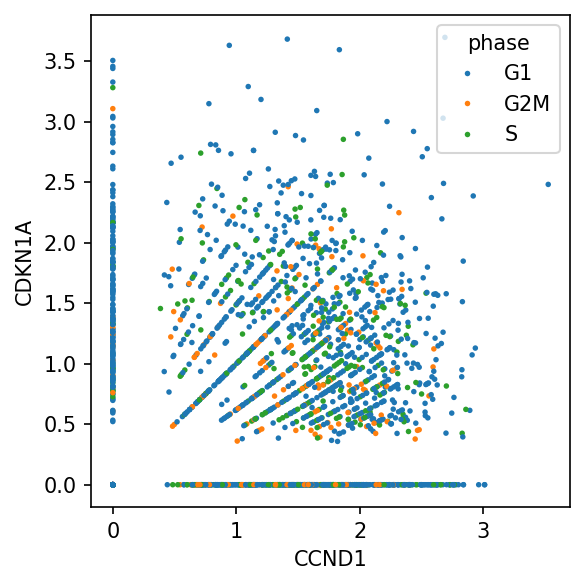

In [65]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

sns.scatterplot(
    df1,
    x='CCND1',
    y='CDKN1A',
    hue='phase',
    # hue_order=['NE', 'low', 'med', 'high'],
    s=7,
    ec='none',
    # ax=ax,
)

plt.tight_layout()
plt.show()

In [74]:
print(df1.shape)
df1.head()

(2255, 6)


,cell_id,CCND1,CDKN1A,cluster_str,phase,ratio
0,AAACCAAAGTAGGGCA_hybrid,1.635624,1.120481,C1,S,1.459751e+00
1,AAACCCGCACCATAGG_hybrid,2.018693,0.596669,C3,G1,3.383269e+00
2,AAACCCGCATCCAATT_hybrid,0.481149,1.782291,C2,G2M,2.699609e-01
3,AAACCCTGTAACGACA_hybrid,1.603431,1.482264,C1,G1,1.081744e+00
4,AAACGGGTCGTAATGT_hybrid,1.615315,0.000000,C2,G2M,1.615315e+12


In [75]:
# filter for cells expressing both

df2 = df1[(df1['CCND1'] > 0) & (df1['CDKN1A'] > 0)].copy()

print(df2.shape)

df2['ratio'] = df2['CCND1'] / df2['CDKN1A']

# eps = 1e-12

# df1['ratio'] = (df1['CCND1'] + eps) / (df1['CDKN1A'] + eps)

# HIGH ratio = HIGH CCND1 LOW p21
# LOW ratio = LOW CCND1 HIGH p21

df2.head()

(1316, 6)


,cell_id,CCND1,CDKN1A,cluster_str,phase,ratio
0,AAACCAAAGTAGGGCA_hybrid,1.635624,1.120481,C1,S,1.459751
1,AAACCCGCACCATAGG_hybrid,2.018693,0.596669,C3,G1,3.383269
2,AAACCCGCATCCAATT_hybrid,0.481149,1.782291,C2,G2M,0.269961
3,AAACCCTGTAACGACA_hybrid,1.603431,1.482264,C1,G1,1.081744
5,AAACGTAAGCGCCTGA_hybrid,2.043051,0.851356,C4,G1,2.399760


In [76]:
df2['ratio'].describe()

count    1316.000000
mean        1.634976
std         1.034872
min         0.177562
25%         0.900704
50%         1.411842
75%         2.121363
max         7.167189
Name: ratio, dtype: float64

In [85]:
df3 = df1[~df1['cell_id'].isin(df2['cell_id'].unique())].copy()

print(df3.shape)

(939, 6)


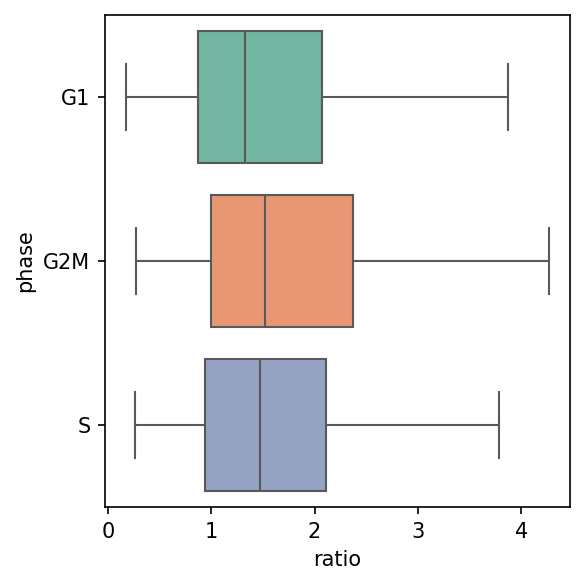

In [79]:
sns.boxplot(
    data=df2,
    x='ratio',
    y='phase',
    hue='phase',
    palette='Set2',
    showfliers=False,
)

# plt.xscale('log')

plt.tight_layout()
plt.show()

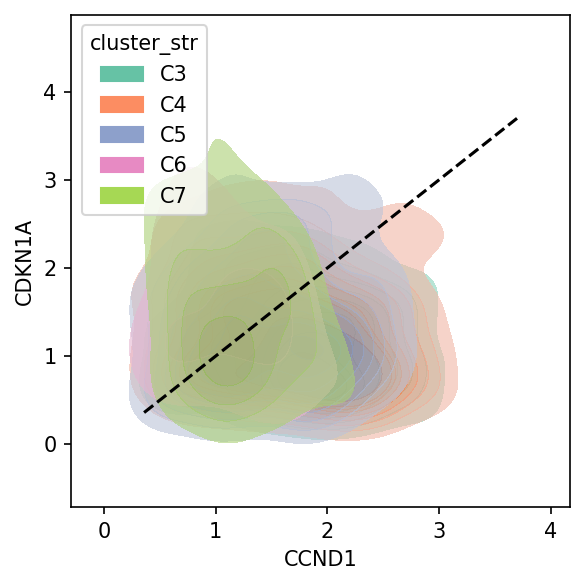

In [94]:
df4 = df2[~df2['cluster_str'].isin(['C1', 'C2'])].copy()
df4['cluster_str'] = df4['cluster_str'].astype(str)

sns.kdeplot(
    data=df4,
    x='CCND1',
    y='CDKN1A',
    hue='cluster_str',
    palette='Set2',
    fill=True,
    alpha=0.6,
)

min_val = min(df4['CCND1'].min(), df4['CDKN1A'].min())
max_val = max(df4['CCND1'].max(), df4['CDKN1A'].max())

plt.plot([min_val, max_val], [min_val, max_val], ls='--', color='black')

plt.tight_layout()
plt.show()

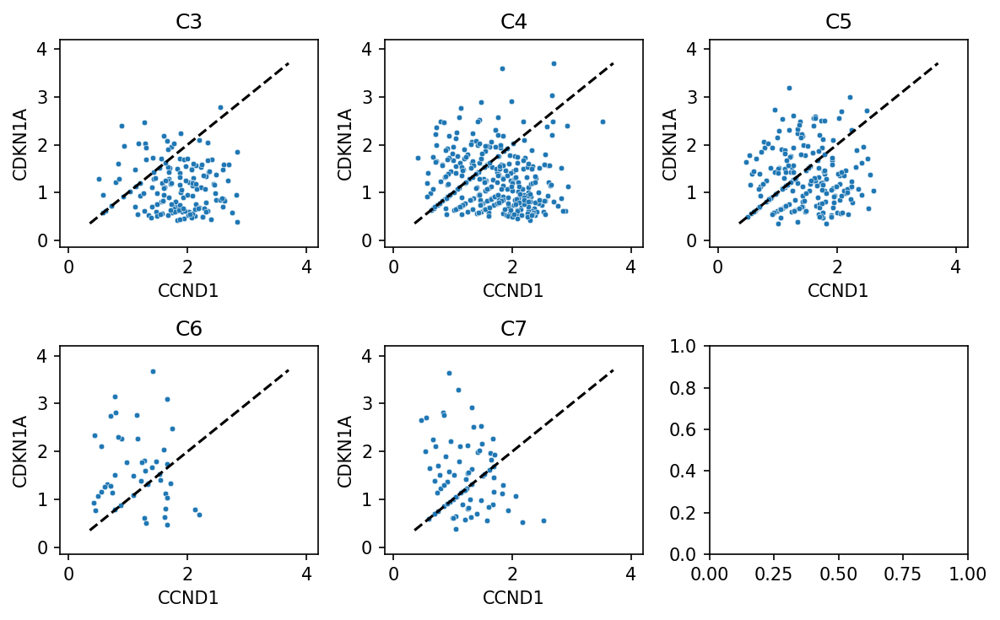

In [100]:
clusts = df4['cluster_str'].unique()

min_val = min(df4['CCND1'].min(), df4['CDKN1A'].min())
max_val = max(df4['CCND1'].max(), df4['CDKN1A'].max())


fig, axes = plt.subplots(2, 3, figsize=(8,5), dpi=150)
axes = axes.flatten()

for i, clust in enumerate(clusts):
    ax = axes[i]
    
    tmp = df4[df4['cluster_str'] == clust]
    
    sns.scatterplot(
        tmp,
        x='CCND1',
        y='CDKN1A',
        s=10,
        ax=ax,
    )
    
    ax.set_xlim(min_val-0.5, max_val+0.5)
    ax.set_ylim(min_val-0.5, max_val+0.5)
    
    ax.plot([min_val, max_val], [min_val, max_val], ls='--', color='black')
    
    ax.set_title(clust)
    
plt.tight_layout()
plt.show()   

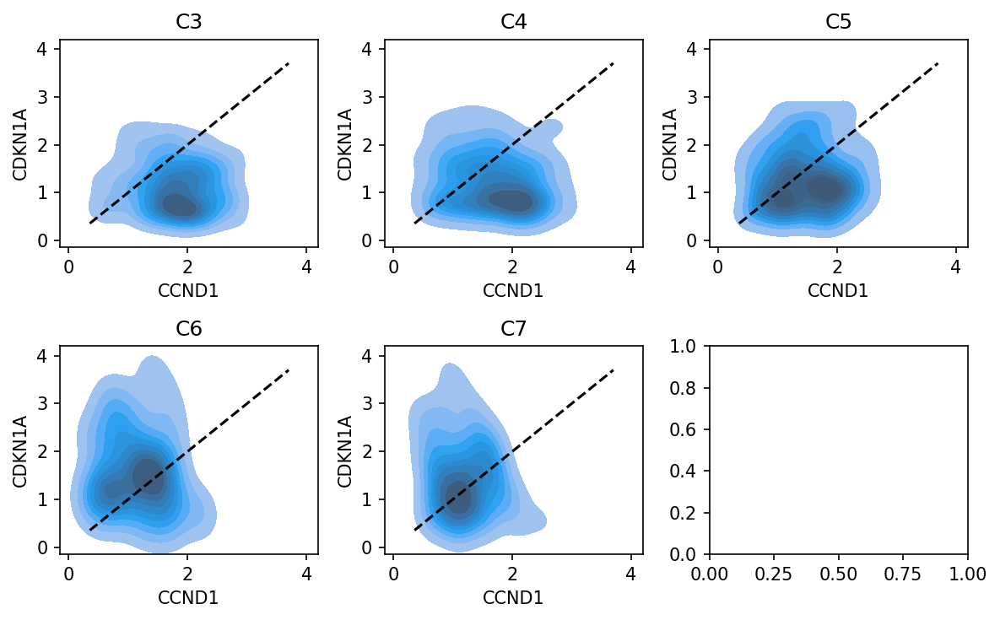

In [99]:
clusts = df4['cluster_str'].unique()

min_val = min(df4['CCND1'].min(), df4['CDKN1A'].min())
max_val = max(df4['CCND1'].max(), df4['CDKN1A'].max())


fig, axes = plt.subplots(2, 3, figsize=(8,5), dpi=150)
axes = axes.flatten()

for i, clust in enumerate(clusts):
    ax = axes[i]
    
    tmp = df4[df4['cluster_str'] == clust]
    
    sns.kdeplot(
        tmp,
        x='CCND1',
        y='CDKN1A',
        fill=True,
        ax=ax,
    )
    
    ax.set_xlim(min_val-0.5, max_val+0.5)
    ax.set_ylim(min_val-0.5, max_val+0.5)
    
    ax.plot([min_val, max_val], [min_val, max_val], ls='--', color='black')
    
    ax.set_title(clust)
    
plt.tight_layout()
plt.show()   

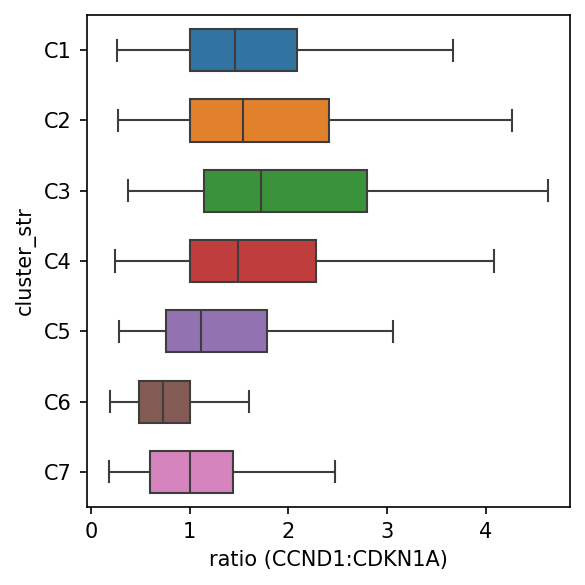

In [115]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

sns.boxplot(
    data=df2,#[df2['phase'] == 'G1'],
    x='ratio',
    y='cluster_str',
    hue='cluster_str',
    palette=mdata.uns['cluster_str_colors'],#'Set2',
    showfliers=False,
    width=0.6,
)

# plt.xscale('log')

plt.xlabel('ratio (CCND1:CDKN1A)')
plt.tight_layout()
plt.show()

In [88]:
df3 = df1[~df1['cell_id'].isin(df2['cell_id'].unique())].copy()

df3['no_ccnd1'] = df3['CCND1'] == 0
df3['no_p21'] = df3['CDKN1A'] == 0

print(df3.shape)
df3.head()

(939, 8)


,cell_id,CCND1,CDKN1A,cluster_str,phase,ratio,no_ccnd1,no_p21
4,AAACGGGTCGTAATGT_hybrid,1.615315,0.000000,C2,G2M,1.615315e+12,False,True
10,AAACTTGCATTAGGAC_hybrid,2.395820,0.000000,C4,G1,2.395820e+12,False,True
11,AAAGCAATCACCTATC_hybrid,1.905373,0.000000,C4,S,1.905373e+12,False,True
16,AAAGCCTCACCATACC_hybrid,2.754286,0.000000,C5,G1,2.754286e+12,False,True
19,AAAGGTCAGATTGGCC_hybrid,0.000000,2.962235,C5,G1,3.375830e-13,True,False


In [89]:
df3.groupby('cluster_str')[['no_ccnd1', 'no_p21']].value_counts()

/tmp/ipykernel_822996/3766547591.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df3.groupby('cluster_str')[['no_ccnd1', 'no_p21']].value_counts()


cluster_str  no_ccnd1  no_p21
C1           False     True      111
             True      False      11
                       True        4
             False     False       0
C2           False     True       67
             True      False      14
                       True        6
             False     False       0
C3           False     True       99
             True      False       3
                       True        1
             False     False       0
C4           False     True      208
             True      False      33
                       True       24
             False     False       0
C5           False     True      103
             True      False      55
                       True       14
             False     False       0
C6           True      False      39
                       True        9
             False     True        3
                       False       0
C7           True      False      59
             False     True       47
        

In [87]:
print(df3['cluster_str'].value_counts())

cluster_str
C4    265
C5    172
C7    135
C1    126
C3    103
C2     87
C6     51
Name: count, dtype: int64


## Cluster DGE

In [118]:
sc.tl.rank_genes_groups(
    mdata,
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    pts=True,
    method='wilcoxon',
    key_added='cluster_str_deg',
)

ranking genes
    finished (0:00:04)


In [133]:
# in HIGH group
deg_key = 'cluster_str_deg'

deg = sc.get.rank_genes_groups_df(
    mdata,
    group=None,
    key=deg_key,
)

deg['direction'] = np.where(deg['logfoldchanges'] > 0, 'up', 'down')

deg = deg[~deg['names'].str.startswith('ENSG')]

print(deg.shape)
deg.head()

# mdf = deg[deg['pvals_adj'] < 0.05].copy()
# print(mdf.shape)
# mdf.head()

(134169, 9)


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,direction
0,C1,PCLAF,25.369717,2.873317,5.446164e-142,1.368403e-137,0.940529,0.307052,up
1,C1,DUT,24.791334,2.336746,1.111790e-135,1.396742e-131,0.971366,0.539145,up
2,C1,CLSPN,24.462620,2.860102,3.694087e-132,3.093921e-128,0.927313,0.290949,up
3,C1,TUBA1B,24.166855,1.944456,4.965713e-129,3.119213e-125,0.988987,0.733481,up
4,C1,TUBB,23.231689,1.715881,2.178780e-119,1.094881e-115,0.997797,0.743476,up


In [134]:
deg = deg.sort_values(by=['group', 'scores'], ascending=[True, False])

deg.groupby('group')[['group', 'names', 'scores', 'pvals_adj', 'pct_nz_group']].head()

,group,names,scores,pvals_adj,pct_nz_group
0,C1,PCLAF,25.369717,1.368403e-137,0.940529
1,C1,DUT,24.791334,1.396742e-131,0.971366
2,C1,CLSPN,24.462620,3.093921e-128,0.927313
3,C1,TUBA1B,24.166855,3.119213e-125,0.988987
4,C1,TUBB,23.231689,1.094881e-115,0.997797
25126,C2,ARL6IP1,20.791208,1.306177e-91,0.995305
25127,C2,CENPF,20.748301,1.595513e-91,0.967136
25128,C2,CDCA8,20.668734,5.547094e-91,0.938967
25129,C2,CCNB1,20.610455,1.389130e-90,0.943662
25130,C2,CKAP2,20.314856,4.775382e-88,0.957746


In [142]:
pd.set_option('display.max_colwidth', None)

# database = "GO_Biological_Process_2026"
database="Reactome_Pathways_2024"
# database="KEGG_2021_Human"
# database='MSigDB_Hallmark_2020' 
# database='KEGG_2026'

n_genes = 50

clusters = deg['group'].unique()


for cluster in clusters:
    
    print(f"Cluster {cluster}:")
    
    tmp = deg[deg['group'] == cluster].copy()
    tmp = tmp.sort_values(by='scores', ascending=False)
    genes = tmp['names'].unique()[:n_genes]

    enr = gget.enrichr(
        genes,
        database,
        save=False,
    )

    enr = enr[enr['adj_p_val'] < 0.05]
    print(enr.columns)

    enr['adj_score'] = abs(np.log(enr['adj_p_val']) * enr['z_score'])
    
    # enr = enr.sort_values(by='adj_score', ascending=False)
    
    display(enr[['path_name', 'overlapping_genes', 'adj_p_val', 'z_score', 'combined_score', 'adj_score']].head(10))
    
    # break

15:22:23 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


Cluster C1:
Index(['rank', 'path_name', 'p_val', 'z_score', 'combined_score',
       'overlapping_genes', 'adj_p_val', 'database'],
      dtype='object')


,path_name,overlapping_genes,adj_p_val,z_score,combined_score,adj_score
0,Cell Cycle,"[TOP2A, HSP90AA1, PCNA, RRM2, TUBB, BRCA1, SMC4, TUBA1B, H2AC14, RPA3, CENPK, CLSPN, TK1, TMPO]",2.001771e-07,11.828959,256.033718,182.450612
1,Apoptotic Execution Phase,"[H1-5, H1-4, HMGB2, CLSPN, HMGB1, VIM]",5.497204e-07,59.003953,1151.622120,850.474483
2,"Cell Cycle, Mitotic","[TOP2A, TUBA1B, HSP90AA1, PCNA, RRM2, H2AC14, TUBB, RPA3, CENPK, TK1, SMC4, TMPO]",5.497204e-07,12.184211,236.193364,175.621457
3,DNA Repair,"[RAD51AP1, FANCI, PCNA, H2AC14, RPA3, PCLAF, USP1, CLSPN, BRCA1, ACTB]",5.497204e-07,16.264901,313.069279,234.439938
4,Apoptosis Induced DNA Fragmentation,"[H1-5, H1-4, HMGB2, HMGB1]",2.444312e-06,192.666667,3378.005218,2489.589883
5,Programmed Cell Death,"[H1-5, H1-4, HSP90AA1, HMGB2, CLSPN, HMGB1, VIM]",5.600146e-05,16.491950,234.498432,161.458378
6,Apoptosis,"[H1-5, H1-4, HMGB2, CLSPN, HMGB1, VIM]",2.700865e-04,16.656566,208.064629,136.863141
7,Signaling by Rho GTPases,"[TUBA1B, HSP90AA1, H2AC14, TPM3, PRC1, CENPK, CFL1, VIM, ACTB, TMPO]",3.233715e-04,7.283988,88.587063,58.539289
8,DNA Damage Bypass,"[PCNA, RPA3, PCLAF, USP1]",3.233715e-04,39.339921,471.721761,316.163482
9,"Signaling by Rho GTPases, Miro GTPases and RHOBTB3","[TUBA1B, HSP90AA1, H2AC14, TPM3, PRC1, CENPK, CFL1, VIM, ACTB, TMPO]",3.233715e-04,7.106195,84.952523,57.110416


15:22:23 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


Cluster C2:
Index(['rank', 'path_name', 'p_val', 'z_score', 'combined_score',
       'overlapping_genes', 'adj_p_val', 'database'],
      dtype='object')


,path_name,overlapping_genes,adj_p_val,z_score,combined_score,adj_score
0,Cell Cycle,"[TOP2A, HJURP, CDCA8, HMMR, SMC4, AURKA, CKS1B, CDC20, TUBA1C, CCNB1, PTTG1, NUF2, GTSE1, BUB1, CENPW, UBE2C, KNL1, TUBB4B, NDC80, CCNA2, TPX2, CENPE, SGO2, CENPF, DBF4, BIRC5, KIF2C]",5.872893e-25,36.478121,2242.596809,2035.270498
1,"Cell Cycle, Mitotic","[TOP2A, CDCA8, HMMR, SMC4, AURKA, CKS1B, CDC20, TUBA1C, CCNB1, PTTG1, NUF2, GTSE1, BUB1, UBE2C, KNL1, TUBB4B, NDC80, CCNA2, TPX2, CENPE, SGO2, CENPF, DBF4, BIRC5, KIF2C]",1.119521e-24,39.631365,2383.413368,2185.635715
2,Resolution of Sister Chromatid Cohesion,"[CDCA8, KNL1, TUBB4B, NDC80, CDC20, CENPE, SGO2, TUBA1C, CENPF, CCNB1, NUF2, BIRC5, KIF2C, BUB1]",5.599789e-18,68.881944,3052.074249,2736.252774
3,Mitotic Anaphase,"[UBE2C, CDCA8, KNL1, TUBB4B, NDC80, CDC20, CENPE, SGO2, TUBA1C, CENPF, CCNB1, PTTG1, NUF2, BIRC5, KIF2C, BUB1]",6.377361e-18,45.325681,1982.595486,1794.614938
4,Mitotic Metaphase and Anaphase,"[UBE2C, CDCA8, KNL1, TUBB4B, NDC80, CDC20, CENPE, SGO2, TUBA1C, CENPF, CCNB1, PTTG1, NUF2, BIRC5, KIF2C, BUB1]",6.377361e-18,45.103370,1969.570292,1785.812766
5,Separation of Sister Chromatids,"[UBE2C, CDCA8, KNL1, TUBB4B, NDC80, CDC20, CENPE, SGO2, TUBA1C, CENPF, PTTG1, NUF2, BIRC5, KIF2C, BUB1]",7.372575e-18,52.349206,2268.845227,2065.111523
6,Mitotic Prometaphase,"[CDCA8, KNL1, TUBB4B, SMC4, NDC80, CDC20, CENPE, SGO2, TUBA1C, CENPF, CCNB1, NUF2, BIRC5, KIF2C, BUB1]",4.581341e-17,45.050152,1858.209926,1694.874786
7,EML4 and NUDC in Mitotic Spindle Formation,"[CDCA8, KNL1, TUBB4B, NDC80, CDC20, CENPE, SGO2, TUBA1C, CENPF, NUF2, BIRC5, KIF2C, BUB1]",4.581341e-17,67.701653,2791.074656,2547.068540
8,Cell Cycle Checkpoints,"[UBE2C, CDCA8, KNL1, NDC80, CCNA2, CDC20, CENPE, SGO2, CENPF, CCNB1, DBF4, NUF2, BIRC5, KIF2C, GTSE1, BUB1]",4.822600e-17,37.848739,1553.955262,1422.001113
9,RHO GTPases Activate Formins,"[CDCA8, KNL1, TUBB4B, NDC80, CDC20, CENPE, SGO2, TUBA1C, CENPF, NUF2, BIRC5, KIF2C, BUB1]",3.990123e-16,55.279279,2144.563391,1960.067223


15:22:23 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


Cluster C3:
Index(['rank', 'path_name', 'p_val', 'z_score', 'combined_score',
       'overlapping_genes', 'adj_p_val', 'database'],
      dtype='object')


,path_name,overlapping_genes,adj_p_val,z_score,combined_score,adj_score
0,Smooth Muscle Contraction,"[MYL6, CALD1, TPM2, TLN1, MYL9, MYL12A]",2.667743e-07,71.454545,1469.234999,1081.597662
1,ECM Proteoglycans,"[COL1A1, COL1A2, SPARC, COL6A1, FN1, DCN]",3.034596e-06,38.727273,665.689434,492.046745
2,Interferon Alpha Beta Signaling,"[IFITM3, IFITM1, IFITM2, IFI6, HLA-B, HLA-C]",3.034596e-06,37.647727,641.207436,478.330653
3,Immune System,"[IFITM3, PDIA3, CD63, IFITM1, IFITM2, ATP6V0E1, IFI6, FN1, HLA-B, HLA-C, CYBA, CKAP4, COL1A1, COL1A2, CD59, TIMP1, B2M, S100A11, CD99]",2.347022e-05,5.124975,75.329112,54.631102
4,Regulation of IGF Transport and Uptake by Insulin-like Growth Factor Binding Proteins (IGFBPs),"[IGFBP4, FN1, IGFBP7, TIMP1, IGFBP6, CKAP4]",2.744214e-05,22.918336,326.883674,240.721157
5,Extracellular Matrix Organization,"[COL1A1, COL1A2, SPARC, COL6A1, FN1, TIMP1, PPIB, DCN]",2.744214e-05,12.823222,181.277041,134.687831
6,"Antigen Presentation Folding, Assembly and Peptide Loading of Class I MHC","[PDIA3, HLA-B, HLA-C, B2M]",3.286592e-05,64.164251,884.288064,662.372331
7,Immunoregulatory Interactions Between a Lymphoid and a non-Lymphoid Cell,"[COL1A1, IFITM1, COL1A2, HLA-B, HLA-C, B2M, CD99]",3.286592e-05,14.872739,201.619244,153.532390
8,Degradation of the Extracellular Matrix,"[COL1A1, COL1A2, COL6A1, FN1, TIMP1, DCN]",3.286592e-05,20.165536,273.259139,208.170325
9,Platelet Aggregation (Plug Formation),"[COL1A1, COL1A2, FN1, TLN1]",6.048741e-05,49.478261,635.075263,480.586077


15:22:24 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


Cluster C4:
Index(['rank', 'path_name', 'p_val', 'z_score', 'combined_score',
       'overlapping_genes', 'adj_p_val', 'database'],
      dtype='object')


,path_name,overlapping_genes,adj_p_val,z_score,combined_score,adj_score
0,rRNA Processing,"[MT-ATP6, RPL7A, RPL5, MT-ND4, MT-CO1, NCL, RPL35A, MT-CO3, MT-ND3, RPL6]",9.982599e-08,21.721366,475.844194,350.144880
1,FASTK Family Proteins Regulate Processing and Stability of Mitochondrial RNAs,"[MT-ATP6, MT-ND4, MT-CO1, MT-CO3, MT-ND3]",1.467303e-07,158.222222,3295.518911,2489.574435
2,Mitochondrial RNA Degradation,"[MT-ATP6, MT-ND4, MT-CO1, MT-CO3, MT-ND3]",4.419620e-07,110.722222,2139.189535,1620.092191
3,Metabolism of RNA,"[RPL5, MT-ND4, SET, ANP32A, MT-CO1, RPL35A, MT-ND3, RPL6, MT-ATP6, RPL7A, NCL, POLR2F, MT-CO3]",2.037464e-06,9.019584,156.079776,118.190865
4,Cellular Response to Chemical Stress,"[MT-CO1, TXNRD1, PRDX1, HMOX1, MT-CO3, TXN, TKT, SQSTM1]",2.037464e-06,19.397153,332.912089,254.176503
5,rRNA Processing in the Mitochondrion,"[MT-ATP6, MT-ND4, MT-CO1, MT-CO3, MT-ND3]",2.037464e-06,67.060606,1146.665463,878.749093
6,Cellular Responses to Stress,"[RPL5, MT-CO1, TXNRD1, RPL35A, TXN, HSPE1, RPL6, RPL7A, PRDX1, HMOX1, MT-CO3, TKT, SQSTM1]",2.108755e-06,8.704798,147.201614,113.766596
7,tRNA Processing in the Mitochondrion,"[MT-ATP6, MT-ND4, MT-CO1, MT-CO3, MT-ND3]",2.570405e-06,59.798799,991.398491,769.697085
8,Nuclear Events Mediated by NFE2L2,"[TXNRD1, PRDX1, HMOX1, TXN, TKT, SQSTM1]",2.807935e-06,33.449495,547.659680,427.586938
9,NFE2L2 Regulating Anti-Oxidant Detoxification Enzymes,"[TXNRD1, PRDX1, HMOX1, TXN]",4.246856e-06,115.565217,1832.129812,1429.464505


15:22:24 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


Cluster C5:
Index(['rank', 'path_name', 'p_val', 'z_score', 'combined_score',
       'overlapping_genes', 'adj_p_val', 'database'],
      dtype='object')


,path_name,overlapping_genes,adj_p_val,z_score,combined_score,adj_score
0,Cytokine Signaling in Immune System,"[EGR1, JUN, SOD2, FGF2, IFIT3, OASL, IFIT2, NFKBIA, ISG20, IL6, IRF1, ABL2, JUNB, RIGI, MCL1]",1.228949e-07,10.806645,234.491599,171.954651
1,Interferon Alpha Beta Signaling,"[ISG20, EGR1, IRF1, IFIT3, OASL, IFIT2]",6.537080e-06,37.647727,641.207436,449.439318
2,FOXO-mediated Transcription,"[BTG1, GADD45A, CITED2, DDIT3, SOD2]",7.425510e-05,35.641577,505.978136,338.880262
3,Interferon Signaling,"[ISG20, EGR1, IRF1, IFIT3, RIGI, OASL, IFIT2]",3.839649e-04,11.733453,141.401573,92.283129
4,Response of EIF2AK1 (HRI) to Heme Deficiency,"[PPP1R15A, DDIT3, ATF3]",3.839649e-04,106.053191,1265.872335,834.104053
5,Generic Transcription Pathway,"[BRD2, JUN, BTG1, GADD45A, CITED2, PLK2, SOD2, HDAC9, IL6, DDIT3, PMAIP1, EPC1, JUNB]",3.839649e-04,5.408270,64.142612,42.535826
6,Immune System,"[EGR1, JUN, TNFAIP3, BCL10, SOD2, FGF2, IFIT3, OASL, IFIT2, NFKBIA, ISG20, IL6, IRF1, ABL2, JUNB, RIGI, MCL1]",4.535931e-04,4.303073,49.654437,33.126389
7,RNA Polymerase II Transcription,"[BRD2, JUN, BTG1, GADD45A, CITED2, PLK2, SOD2, HDAC9, IL6, DDIT3, PMAIP1, EPC1, JUNB]",8.461109e-04,4.852405,52.320161,34.330085
8,Gene Expression (Transcription),"[BRD2, JUN, BTG1, GADD45A, CITED2, PLK2, SOD2, HDAC9, TAF1D, IL6, DDIT3, PMAIP1, EPC1, JUNB]",1.003269e-03,4.457041,46.772916,30.773598
9,Cellular Responses to Stimuli,"[PPP1R15A, NFKBIA, JUN, IL6, CITED2, DDIT3, SOD2, BACH1, ETS1, ATF3]",1.863121e-03,5.437001,53.118493,34.174284


15:22:24 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


Cluster C6:
Index(['rank', 'path_name', 'p_val', 'z_score', 'combined_score',
       'overlapping_genes', 'adj_p_val', 'database'],
      dtype='object')


,path_name,overlapping_genes,adj_p_val,z_score,combined_score,adj_score


15:22:24 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


Cluster C7:
Index(['rank', 'path_name', 'p_val', 'z_score', 'combined_score',
       'overlapping_genes', 'adj_p_val', 'database'],
      dtype='object')


,path_name,overlapping_genes,adj_p_val,z_score,combined_score,adj_score
0,Gene Expression (Transcription),"[GADD45A, CITED2, PLK2, HDAC9, ELL2, RUNX1, TAF1D, CDK6, SNAPC1, DDIT3, MYC, EPC1, DPF3]",0.020978,4.024092,36.225298,15.550205
1,Insulin-like Growth Factor-2 mRNA Binding Proteins (IGF2BPs IMPs VICKZs) Bind RNA,"[MYC, IGF2BP2]",0.020978,138.500000,1202.251780,535.202380
2,RNA Polymerase II Transcription,"[CDK6, SNAPC1, GADD45A, CITED2, PLK2, DDIT3, MYC, EPC1, HDAC9, ELL2, RUNX1]",0.029588,3.889130,30.072346,13.691226
3,FOXO-mediated Transcription,"[GADD45A, CITED2, DDIT3]",0.029588,19.833112,146.188979,69.820151
4,Response of EIF2AK1 (HRI) to Heme Deficiency,"[PPP1R15A, DDIT3]",0.029588,63.900641,470.944287,224.954736
5,FOXO-mediated Transcription of Cell Death Genes,"[CITED2, DDIT3]",0.029588,59.333333,429.455376,208.876063


In [138]:
clusters = deg['group'].unique()

n_genes = 50

for cluster in clusters:
    tmp = deg[deg['group'] == cluster].copy()
    tmp = tmp.sort_values(by='scores', ascending=False)
    genes = tmp['names'].unique()[:n_genes]


    print(f"Cluster {cluster}:")
    print(", ".join(genes), "\n")
    # print(", ".join(sorted(genes)), "\n")

Cluster C1:
PCLAF, DUT, CLSPN, TUBA1B, TUBB, HMGB1, STMN1, H2AZ1, PTMA, TMPO, MKI67, HSP90AA1, TOP2A, DEK, PCNA, RRM1, ACTB, RANBP1, RRM2, GAPDH, ATAD2, HELLS, NUSAP1, H1-4, PPIA, SMC4, HSPA8, CEP55, TPM3, HMGB2, CACYBP, VIM, RPA3, NUCKS1, PRC1, DNMT1, CENPK, TK1, BRCA1, CFL1, MIR924HG, H1-5, PTGES3, ANP32E, H2AC14, RAD51AP1, DNAJC9, NASP, USP1, FANCI 

Cluster C2:
ARL6IP1, CENPF, CDCA8, CCNB1, CKAP2, ASPM, CKS2, AURKA, TOP2A, PRC1, PTTG1, HMGB2, TPX2, HMMR, GTSE1, MKI67, BIRC5, UBE2C, KIF2C, NUSAP1, KIF20B, CCNA2, SMC4, DLGAP5, CENPE, CDC20, KPNA2, DEPDC1, CEP55, SGO2, NUCKS1, TACC3, HMGB1, BUB1, CDCA2, HJURP, CKS1B, CDKN3, CENPW, ANLN, H2AZ1, DBF4, NDC80, KNL1, TUBA1C, NUF2, TUBB4B, TRIM59, KIF14, JPT1 

Cluster C3:
TIMP1, IFI6, B2M, RABAC1, S100A11, IGFBP6, FN1, COL1A2, LY6E, HLA-B, IGFBP4, TAGLN, IFITM2, TPM2, SERF2, CKAP4, PPIB, SERPINE2, MYL9, RRBP1, SH3BGRL3, TSPO, CD59, DCN, CALD1, IFITM1, MYL6, HLA-C, COL1A1, VAMP5, SSR4, IGFBP7, COL6A1, CLMP, IFITM3, SELENOM, EMP3, TLN1, SPAR

In [147]:
print(", ".join(sorted(myo_genes1)))

ABLIM1, ACHE, ACSL1, ACTA1, ACTC1, ACTN2, ADAM12, ADCY9, AEBP1, AGL, AGRN, AK1, AKT2, ANKRD2, APOD, APP, ATP2A1, ATP6AP1, BAG1, BDKRB2, BHLHE40, BIN1, CAMK2B, CASQ1, CAV3, CD36, CDH13, CDKN1A, CFD, CHRNA1, CHRNB1, CKB, CKM, CKMT2, CLU, CNN3, COL15A1, COL1A1, COL3A1, COL4A2, COL6A2, COL6A3, COX7A1, CRAT, CRYAB, CTF1, DAPK2, DENND2B, DES, DMD, DMPK, DTNA, EFS, EIF4A2, ENO3, EPHB3, ERBB3, FABP3, FDPS, FGF2, FHL1, FKBP1B, FLII, FOXO4, FST, FXYD1, GAA, GABARAPL2, GADD45B, GJA5, GNAO1, GPX3, GSN, HBEGF, HDAC5, HRC, HSPB2, HSPB8, IFRD1, IGF1, IGFBP3, IGFBP7, ITGA7, ITGB1, ITGB4, ITGB5, KCNH1, KIFC3, KLF5, LAMA2, LARGE1, LDB3, LPIN1, MAPK12, MAPRE3, MB, MEF2A, MEF2C, MEF2D, MRAS, MYBPC3, MYF6, MYH11, MYH2, MYH3, MYH9, MYL11, MYL3, MYL4, MYL6B, MYLK, MYO1C, MYOM1, MYOM2, MYOZ1, NAV2, NCAM1, NOS1, NOTCH1, NQO1, OCEL1, PC, PDE4DIP, PDLIM7, PFKM, PICK1, PKIA, PLXNB2, PPFIA4, PPP1R3C, PRNP, PSEN2, PTGIS, PTP4A3, PYGM, RB1, RIT1, RYR1, SCD, SCHIP1, SGCA, SGCD, SGCG, SH2B1, SH3BGR, SIRT2, SLC6A8, SMT

In [148]:
mdata.X = mdata.layers['log_norm']

n_genes = 20

mean_expr = mdata[:, myo_genes1].X.mean(axis=0).A1  
top_myo_genes = [myo_genes1[i] for i in mean_expr.argsort()[::-1][:n_genes]]

print(len(top_myo_genes))
top_myo_genes

20


['TPM2',
 'TPM3',
 'COL1A1',
 'ITGB1',
 'SPARC',
 'TAGLN',
 'STC2',
 'NQO1',
 'EIF4A2',
 'COL6A3',
 'NAV2',
 'CDKN1A',
 'FGF2',
 'MYLK',
 'GADD45B',
 'CNN3',
 'GABARAPL2',
 'MYH9',
 'IGFBP3',
 'SPTAN1']

## Pseudotime

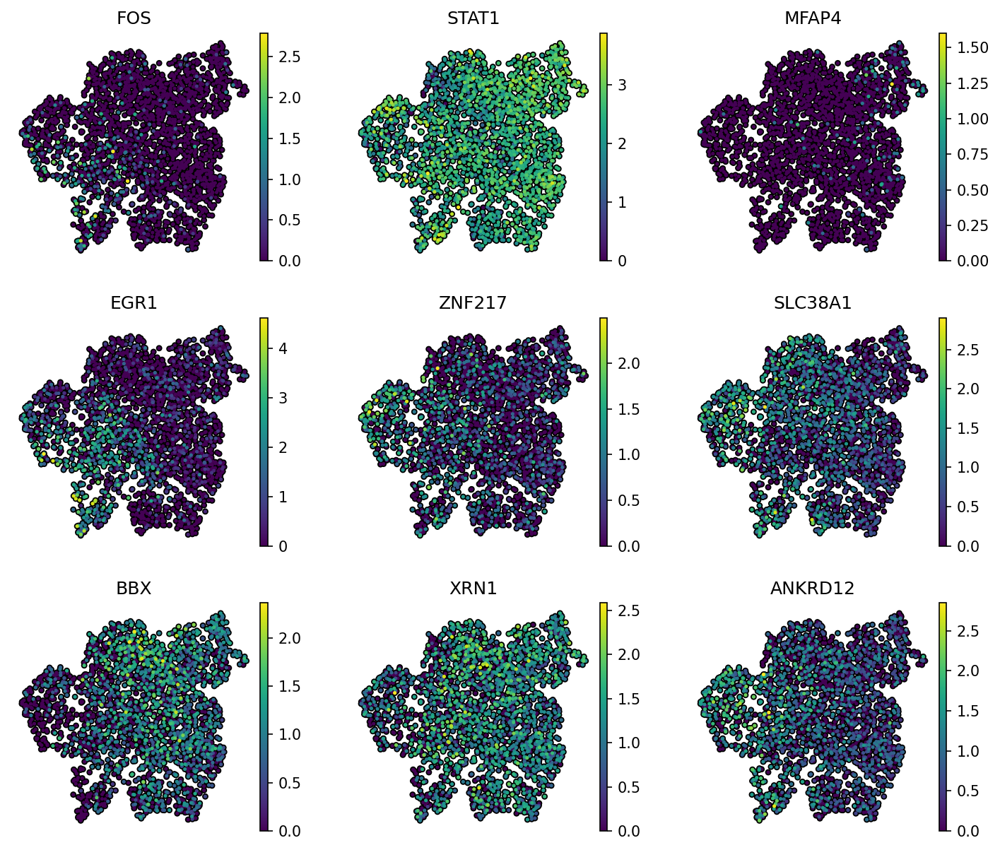

In [116]:
# early G1 markers
genes = [
    "FOS", "STAT1", "MFAP4", "EGR1", "ZNF217",
    "SLC38A1","BBX","XRN1", "ANKRD12",
]

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    mdata,
    color=genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

In [49]:
def find_closest_cell(adata, obs_key='phase', value='G1', obsm_key='X_pca', dataset=None):
    """
    Find the cell closest to a median vector in PCA space for a given group and optional dataset.

    Parameters:
        adata (AnnData): Annotated data matrix.
        obs_key (str): Key in adata.obs indicating group.
        value (str): The value for aggregation (e.g., 'G1').
        obsm_key (str): Key in adata.obsm for PCA or other embedding (e.g., 'X_pca').
        dataset (str, optional): Name of dataset in adata.obs['dataset'] to restrict search.

    Returns:
        tuple: (cell_id (str), index (int)) of the closest matching cell in adata.obs_names.
    """
    mask = adata.obs[obs_key] == value
    if dataset is not None:
        mask &= adata.obs['dataset'] == dataset

    emb = adata.obsm[obsm_key][mask]
    
    if emb.shape[0] == 0:
        raise ValueError("No cells match the specified filters.")

    median_vec = np.median(emb, axis=0)
    dists = cdist(emb, median_vec.reshape(1, -1)).flatten()
    closest_idx = np.argmin(dists)

    cell_id = adata.obs_names[mask][closest_idx]
    cell_index = np.where(adata.obs_names == cell_id)[0][0]

    return cell_id, cell_index

In [163]:
cell_id, root_idx = find_closest_cell(mdata, value='G2M', obsm_key='X_pca')
print(cell_id, root_idx)

CATACCTTCGAACCTA_hybrid 782


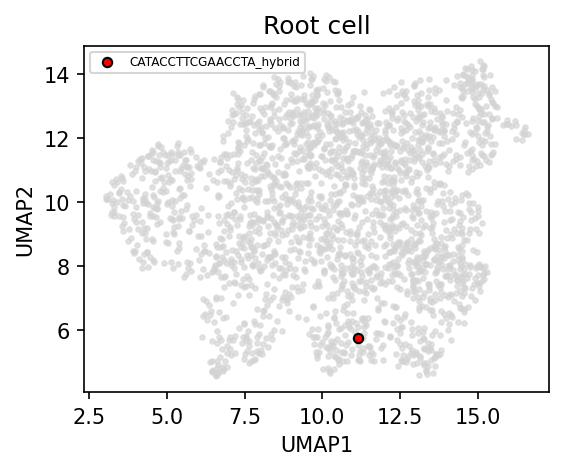

In [159]:
umap = mdata.obsm["X_umap"]
x, y = umap[:, 0], umap[:, 1]

# Plot all cells
plt.figure(figsize=(4, 3))
plt.scatter(x, y, s=5, color='lightgray', alpha=0.6)

# Highlight your cell
plt.scatter(x[root_idx], y[root_idx], s=20, color='red', edgecolor='black', label=cell_id)

plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.legend(fontsize='xx-small')
plt.title("Root cell")
plt.show()

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9760423  0.9605818  0.9564866  0.9473418  0.9340773
     0.9294129  0.9221662  0.9071554  0.9029094  0.89326566 0.8858439
     0.8768397  0.8677406  0.8646852 ]
    finished (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00)


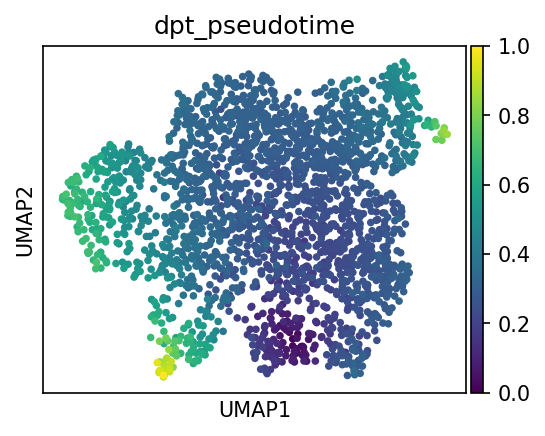

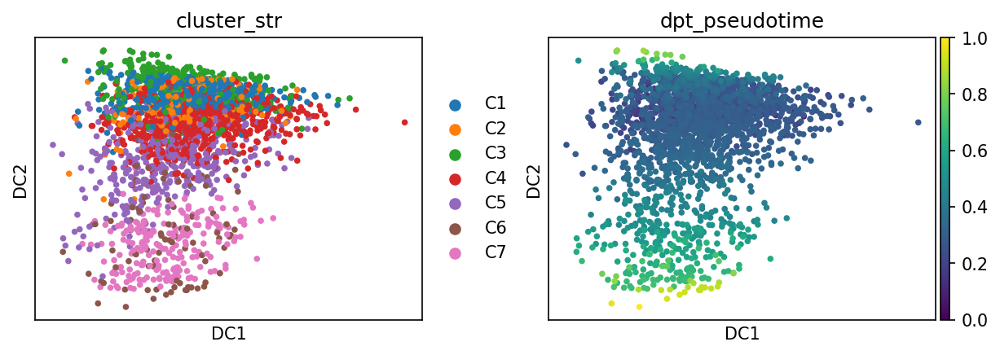

In [164]:
mdata.uns["iroot"] = root_idx

sc.tl.diffmap(mdata)
sc.tl.dpt(mdata)
    
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 3

sc.pl.umap(mdata, color='dpt_pseudotime', color_map='viridis')
sc.pl.diffmap(mdata, color=['cluster_str', 'dpt_pseudotime'], ncols=2)

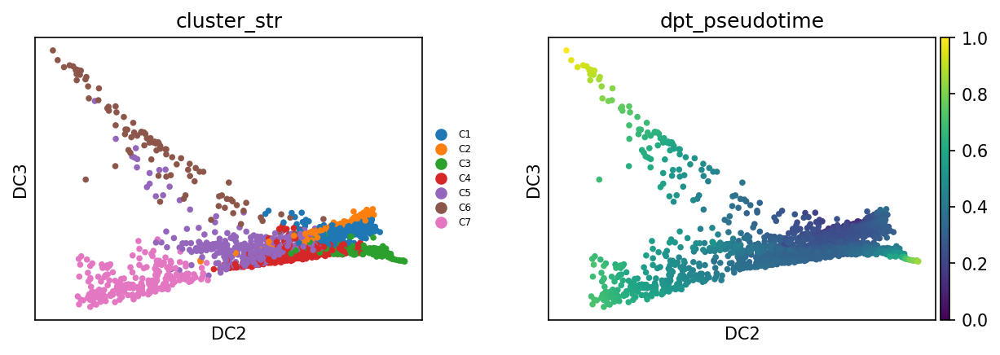

In [165]:
sc.pl.diffmap(
    mdata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='2d',
    components=['2,3'],
    legend_fontsize='xx-small',
)

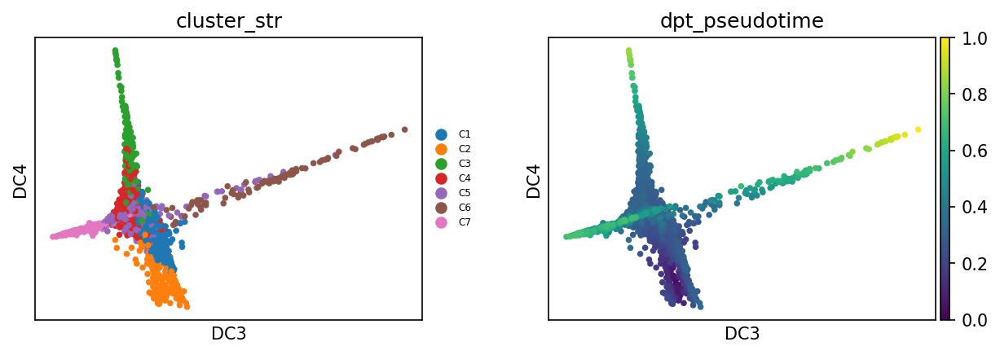

In [166]:
sc.pl.diffmap(
    mdata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='2d',
    components=['3,4'],
    legend_fontsize='xx-small',
)

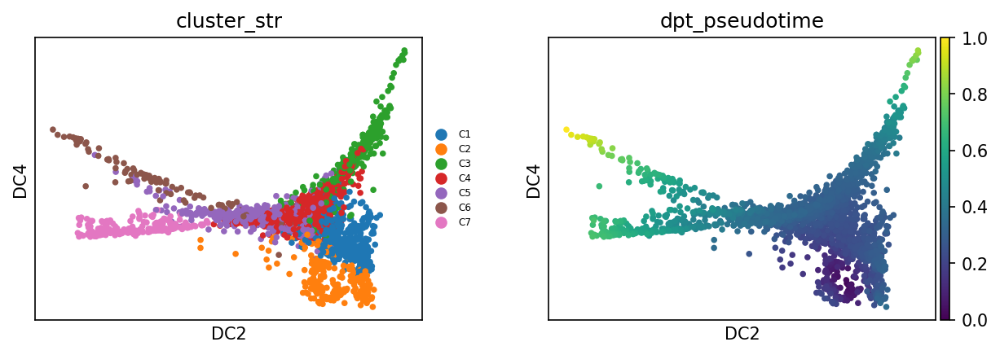

In [167]:
sc.pl.diffmap(
    mdata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='2d',
    components=['2,4'],
    legend_fontsize='xx-small',
)

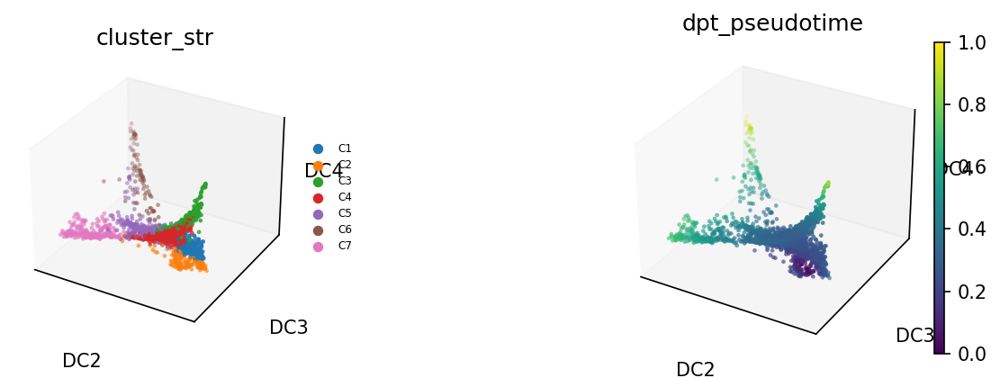

In [169]:
sc.pl.diffmap(
    mdata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='3d',
    components=['2,3,4'],
    legend_fontsize='xx-small',
)

# Load Exo/Endo

In [36]:
%%time
fpath = "/scratch/indikar_root/indikar1/shared_data/HYB/endo_vs_exo/processed_all_groups_wExoEndo_v2.h5ad"
edata = sc.read_h5ad(fpath)
edata

CPU times: user 684 ms, sys: 2.21 s, total: 2.89 s
Wall time: 18.1 s


AnnData object with n_obs × n_vars = 16296 × 25128
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'mean', 'st

In [38]:
# filter for mmMYOD1 cells
edata = edata[edata.obs['pooled_condition'] == 'mmMYOD1', :].copy()
edata

AnnData object with n_obs × n_vars = 2255 × 25128
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'mean', 'std

In [37]:
mdata

AnnData object with n_obs × n_vars = 2255 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split', 'sasp_score', 'skel_mus_score', 'myogenesis_score', 'qui_TFs_score', 'qui_genes_score', 'qui_down_score'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'l

In [40]:
obs_cols = [
    'S_score', 'G2M_score', 'phase', 'cluster_str',
    'sasp_score', 'skel_mus_score', 'myogenesis_score', 'qui_TFs_score', 'qui_genes_score', 'qui_down_score',
]

df = mdata.obs[obs_cols].copy()
print(df.shape)
df.head()

(2255, 10)


,S_score,G2M_score,phase,cluster_str,sasp_score,skel_mus_score,myogenesis_score,qui_TFs_score,qui_genes_score,qui_down_score
AAACCAAAGTAGGGCA_hybrid,0.301382,-0.390685,S,C1,0.203268,0.095080,0.038903,0.135472,0.112147,0.270069
AAACCCGCACCATAGG_hybrid,-0.504071,-1.535523,G1,C3,0.165323,0.077276,0.113653,0.162043,0.287199,0.303165
AAACCCGCATCCAATT_hybrid,-0.266716,3.495272,G2M,C2,0.207997,0.091774,0.048093,0.039338,0.177110,0.415557
AAACCCTGTAACGACA_hybrid,-0.916605,-0.384040,G1,C1,0.160553,0.097450,0.140272,0.106536,0.257363,0.150504
AAACGGGTCGTAATGT_hybrid,-0.078954,2.057884,G2M,C2,0.150325,0.135651,0.078709,0.045992,0.164948,0.377005


In [41]:
edata.obs.index.equals(df.index)

True

In [43]:
edata.obs = edata.obs.drop(columns=['S_score', 'G2M_score', 'phase', 'cluster_str'])
edata

AnnData object with n_obs × n_vars = 2255 × 25128
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'm

In [44]:
# add obs to edata

edata.obs = edata.obs.join(df)
display(edata.obs.head())
edata

,MYOD-fb_counts,PRRX1-fb_counts,PRRX1_MYOD-fb_counts,assigned_condition,total_fb_counts,condition_counts_rate,G1-fb_counts,G2M-fb_counts,S-fb_counts,dataset,...,S_score,G2M_score,phase,cluster_str,sasp_score,skel_mus_score,myogenesis_score,qui_TFs_score,qui_genes_score,qui_down_score
AAACCAAAGTAGGGCA_hybrid,14.0,1.0,1.0,MYOD,16.0,0.875000,NaN,NaN,NaN,Hybrid,...,0.301382,-0.390685,S,C1,0.203268,0.095080,0.038903,0.135472,0.112147,0.270069
AAACCCGCACCATAGG_hybrid,22.0,0.0,1.0,MYOD,23.0,0.956522,NaN,NaN,NaN,Hybrid,...,-0.504071,-1.535523,G1,C3,0.165323,0.077276,0.113653,0.162043,0.287199,0.303165
AAACCCGCATCCAATT_hybrid,22.0,2.0,1.0,MYOD,25.0,0.880000,NaN,NaN,NaN,Hybrid,...,-0.266716,3.495272,G2M,C2,0.207997,0.091774,0.048093,0.039338,0.177110,0.415557
AAACCCTGTAACGACA_hybrid,24.0,0.0,1.0,MYOD,25.0,0.960000,NaN,NaN,NaN,Hybrid,...,-0.916605,-0.384040,G1,C1,0.160553,0.097450,0.140272,0.106536,0.257363,0.150504
AAACGGGTCGTAATGT_hybrid,25.0,0.0,0.0,MYOD,25.0,1.000000,NaN,NaN,NaN,Hybrid,...,-0.078954,2.057884,G2M,C2,0.150325,0.135651,0.078709,0.045992,0.164948,0.377005


AnnData object with n_obs × n_vars = 2255 × 25128
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'leiden_split', 'S_score', 'G2M_score', 'phase', 'cluster_str', 'sasp_score', 'skel_mus_score', 'myogenesis_score', 'qui_TFs_score', 'qui_genes_score', 'qui_down_score'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'l

In [46]:
# save full UMAP
edata.obsm['X_umap_full'] = edata.obsm['X_umap'].copy()
# add new one
edata.obsm['X_umap'] = mdata.obsm['X_umap'].copy()

# add other stuff
edata.uns['cluster_str_colors'] = mdata.uns['cluster_str_colors'].copy()

edata

AnnData object with n_obs × n_vars = 2255 × 25128
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'leiden_split', 'S_score', 'G2M_score', 'phase', 'cluster_str', 'sasp_score', 'skel_mus_score', 'myogenesis_score', 'qui_TFs_score', 'qui_genes_score', 'qui_down_score'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'l

In [55]:
edata.obsm['X_pca'] = mdata.obsm['X_pca'].copy()

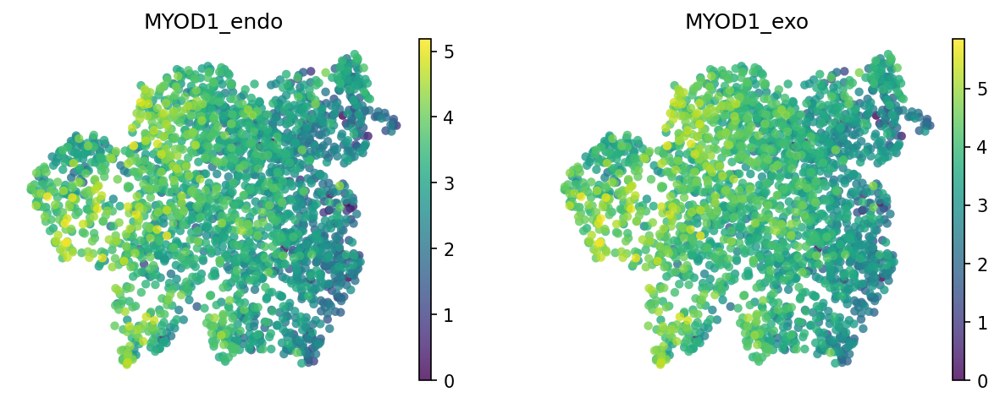

In [84]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 3.5

sc.pl.umap(
    edata,
    color=['MYOD1_endo', 'MYOD1_exo'],
    size=100,
    ncols=2,
    frameon=False,
    alpha=0.8,
    layer='log_norm',
)

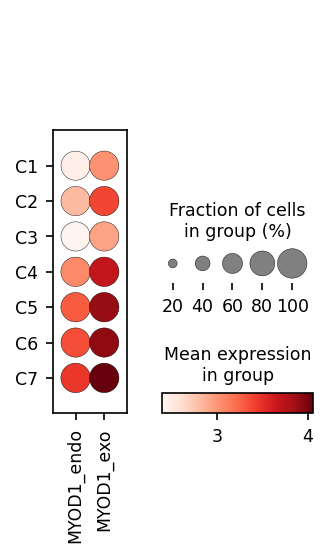

In [89]:
sc.pl.dotplot(
    edata,
    var_names=['MYOD1_endo', 'MYOD1_exo'],
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='',
    # standard_scale='var',
)

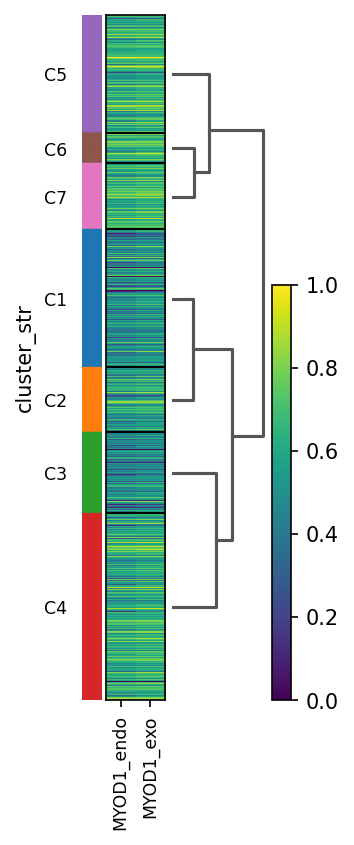

In [96]:
sc.pl.heatmap(
    edata,
    var_names=['MYOD1_endo', 'MYOD1_exo'],
    groupby='cluster_str',
    layer='log_norm',
    dendrogram=True,
    standard_scale='var',
)
    

## Pseudotime

In [51]:
cell_id, root_idx = find_closest_cell(edata, value='G2M', obsm_key='X_pca')
print(cell_id, root_idx)

CATACCTTCGAACCTA_hybrid 782


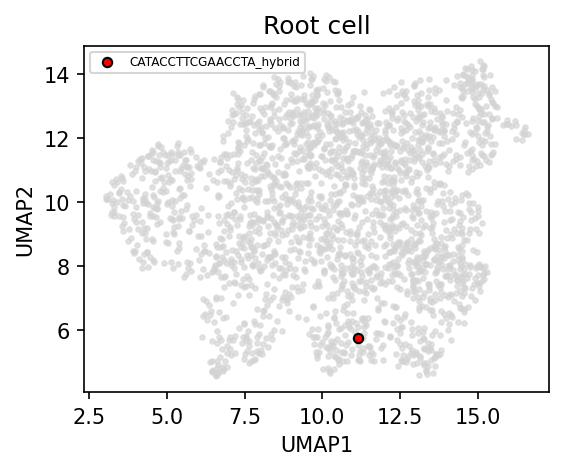

In [52]:
umap = edata.obsm["X_umap"]
x, y = umap[:, 0], umap[:, 1]

# Plot all cells
plt.figure(figsize=(4, 3))
plt.scatter(x, y, s=5, color='lightgray', alpha=0.6)

# Highlight your cell
plt.scatter(x[root_idx], y[root_idx], s=20, color='red', edgecolor='black', label=cell_id)

plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.legend(fontsize='xx-small')
plt.title("Root cell")
plt.show()

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9760423  0.9605818  0.9564866  0.9473418  0.9340773
     0.9294129  0.9221662  0.9071554  0.9029094  0.89326566 0.8858439
     0.8768397  0.8677406  0.8646852 ]
    finished (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00)


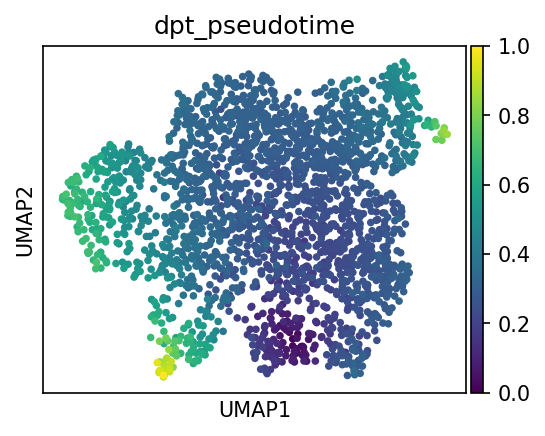

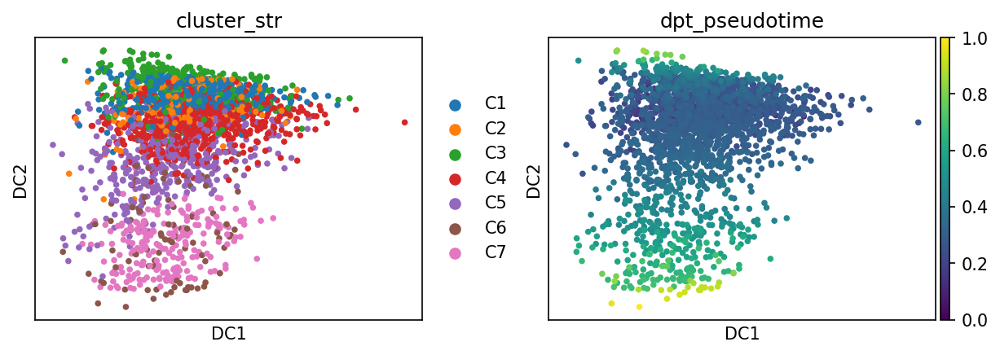

In [57]:
sc.pp.neighbors(
    edata,
    n_neighbors=10,
)


edata.uns["iroot"] = root_idx

sc.tl.diffmap(edata)
sc.tl.dpt(edata)
    
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 3

sc.pl.umap(edata, color='dpt_pseudotime', color_map='viridis')
sc.pl.diffmap(edata, color=['cluster_str', 'dpt_pseudotime'], ncols=2)

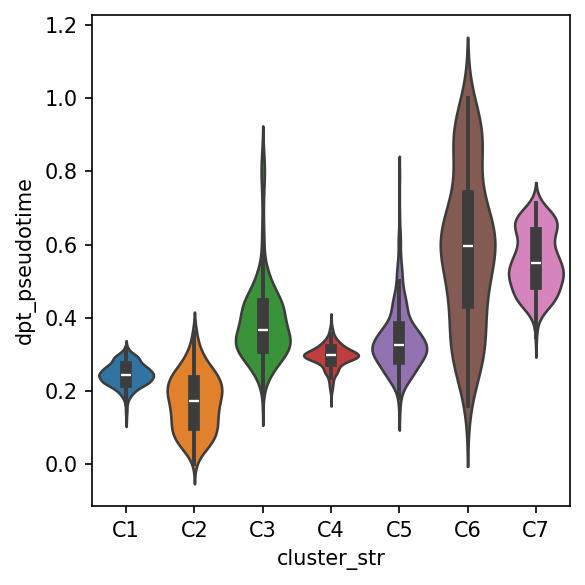

In [114]:
sns.violinplot(
    data=edata.obs,
    x='cluster_str',
    y='dpt_pseudotime',
    hue='cluster_str',
    palette=edata.uns['cluster_str_colors'],
    # showfliers=False,
)

plt.tight_layout()
plt.show()

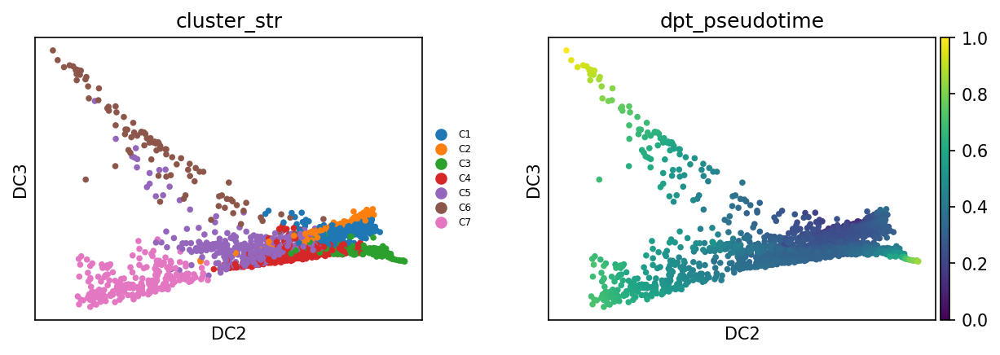

In [58]:
sc.pl.diffmap(
    edata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='2d',
    components=['2,3'],
    legend_fontsize='xx-small',
)

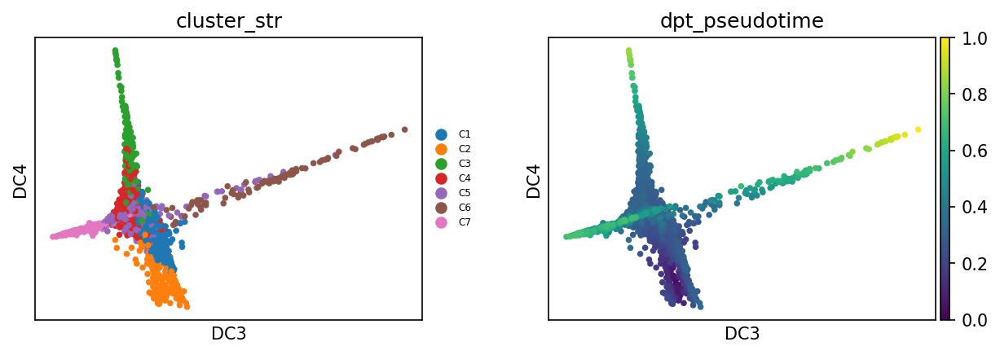

In [59]:
sc.pl.diffmap(
    edata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='2d',
    components=['3,4'],
    legend_fontsize='xx-small',
)

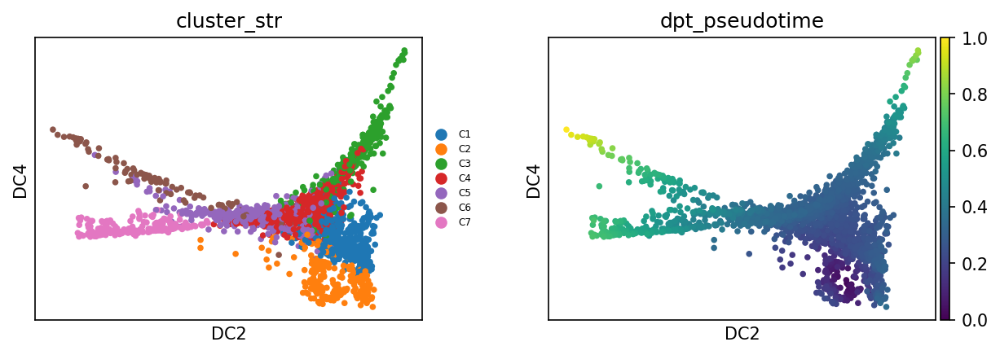

In [60]:
sc.pl.diffmap(
    edata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='2d',
    components=['2,4'],
    legend_fontsize='xx-small',
)

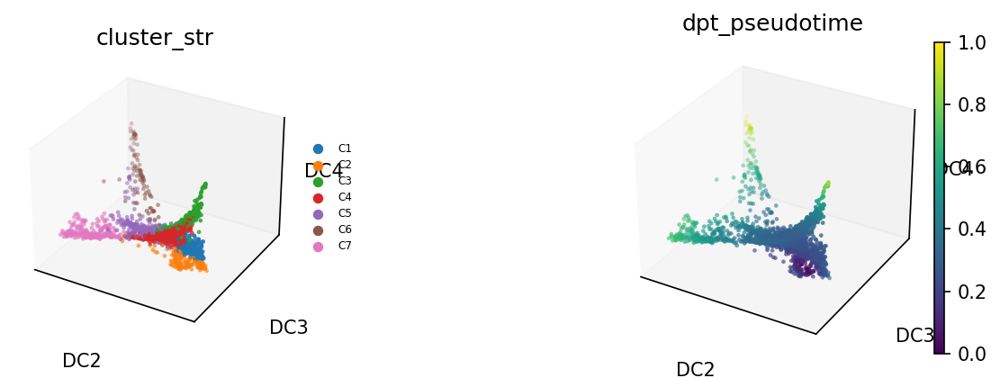

In [61]:
sc.pl.diffmap(
    edata,
    color=['cluster_str', 'dpt_pseudotime'],
    ncols=2,
    projection='3d',
    components=['2,3,4'],
    legend_fontsize='xx-small',
)

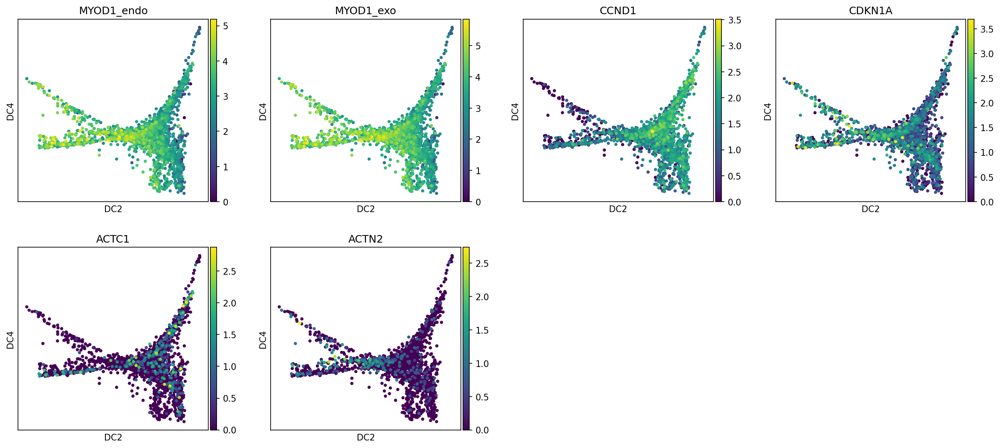

In [103]:
genes_to_plot = [
    'MYOD1_endo', 'MYOD1_exo',
    'CCND1', 'CDKN1A', 'ACTC1', 'ACTN2',
]

sc.pl.diffmap(
    edata,
    color=genes_to_plot,
    ncols=4,
    projection='2d',
    components=['2,4'],
    legend_fontsize='xx-small',
    layer='log_norm',
)

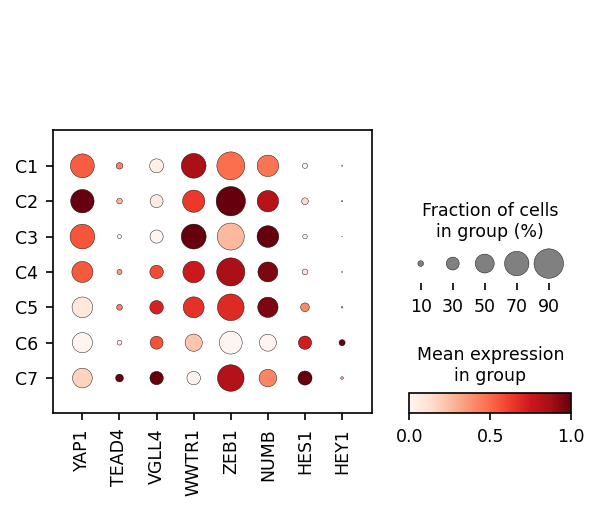

In [111]:
sc.pl.dotplot(
    edata,
    var_names=['YAP1', 'TEAD4', 'VGLL4', 'WWTR1', 'ZEB1', 'NUMB', 'HES1', 'HEY1',],
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='',
    standard_scale='var',
)

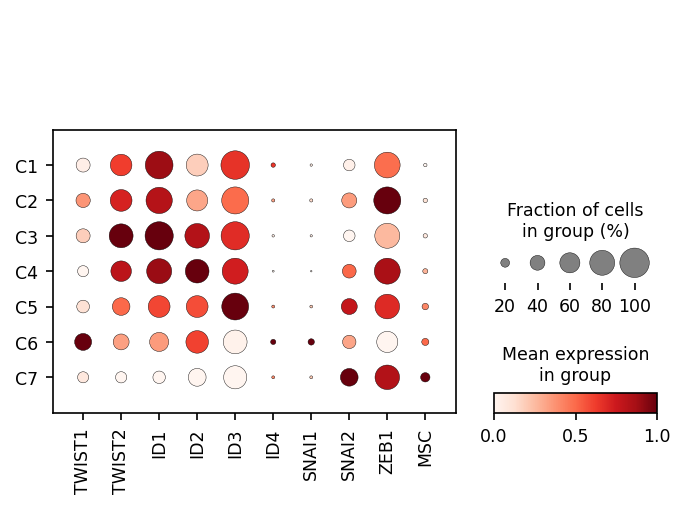

In [113]:
myod_inhibitors = [
    'TWIST1', 'TWIST2', 'ID1', 'ID2', 'ID3', 'ID4', 'SNAI1', 'SNAI2', 'ZEB1', 'MSC', 'MIST1'
]

myod_inhibitors = [g for g in myod_inhibitors if g in edata.var_names]
    
sc.pl.dotplot(
    edata,
    var_names=myod_inhibitors,
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    title='',
    standard_scale='var',
)

In [ ]:
# heatmap - root in center, 

In [64]:
obs = edata.obs[['cluster_str', 'phase', 'S_score', 'G2M_score', 'dpt_pseudotime']].copy()

obs = obs.sort_values(by='dpt_pseudotime')

obs.head()

,cluster_str,phase,S_score,G2M_score,dpt_pseudotime
CATACCTTCGAACCTA_hybrid,C2,G2M,-0.162596,0.488180,0.000000
AAAGCATGTGAAGGCT_hybrid,C2,G2M,0.046755,2.396052,0.021529
CTAAGCCAGGTGGCTT_hybrid,C2,G2M,-0.326425,1.676463,0.024468
AGCCAGCCACTTGCTA_hybrid,C2,G2M,0.159018,1.679210,0.031581
TGAATCCGTAAGGTAT_hybrid,C2,G2M,-0.408586,0.388385,0.032291


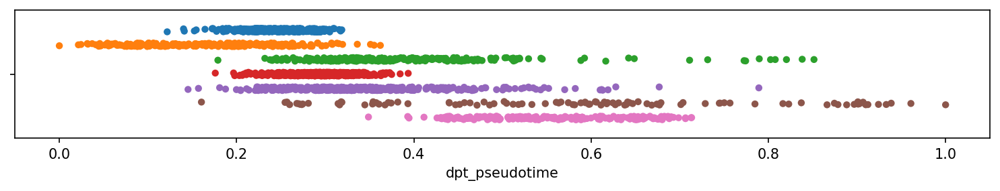

In [71]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 10, 2

sns.stripplot(
    data=edata.obs,
    x='dpt_pseudotime',
    hue='cluster_str',
    palette=edata.uns['cluster_str_colors'],
    dodge=True,
    edgecolor='none',
    s=5,
    legend=False,
    linewidth=0,
)

plt.tight_layout()
plt.show()

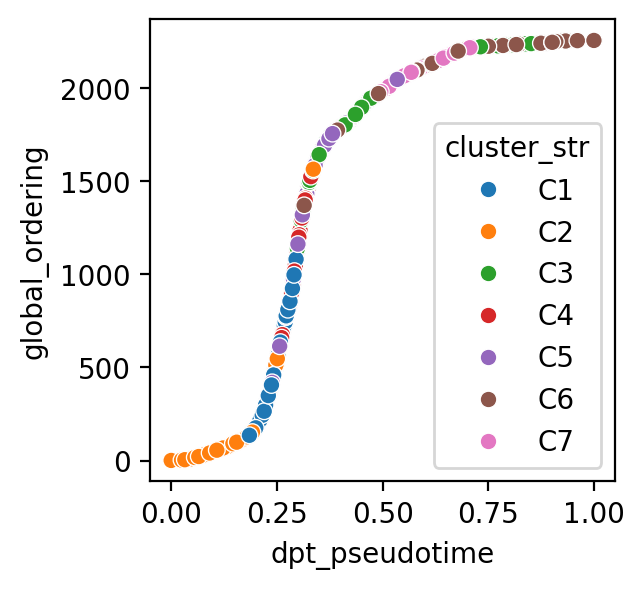

In [117]:
edata.obs['global_ordering'] = edata.obs['dpt_pseudotime'].rank(ascending=True)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(
    data=edata.obs,
    x=edata.obs['dpt_pseudotime'],
    y=edata.obs['global_ordering'],
    # hue='phase',
    hue='cluster_str',
    # palette=palette,
)

plt.show()

In [72]:
# compute ratio of exo and endo
endo_idx = edata.var_names.get_loc('MYOD1_endo')
exo_idx  = edata.var_names.get_loc('MYOD1_exo')

layer = 'norm'

expr = edata.layers[layer]
if not isinstance(expr, np.ndarray):
    expr = expr.toarray()

endo_exp = expr[:, endo_idx]
exo_exp  = expr[:, exo_idx]

# Calculate ratio safely (NaN where exo is 0)
ratio = np.divide(endo_exp, exo_exp, out=np.full_like(endo_exp, np.nan), where=exo_exp!=0)

edata.obs['MYOD1_endo_exo_ratio'] = ratio

# display(adata_expanded.obs.head())
display(edata.obs['MYOD1_endo_exo_ratio'].describe())

count    2245.000000
mean        0.544927
std         0.114232
min         0.000000
25%         0.477273
50%         0.545455
75%         0.615385
max         1.000000
Name: MYOD1_endo_exo_ratio, dtype: float64

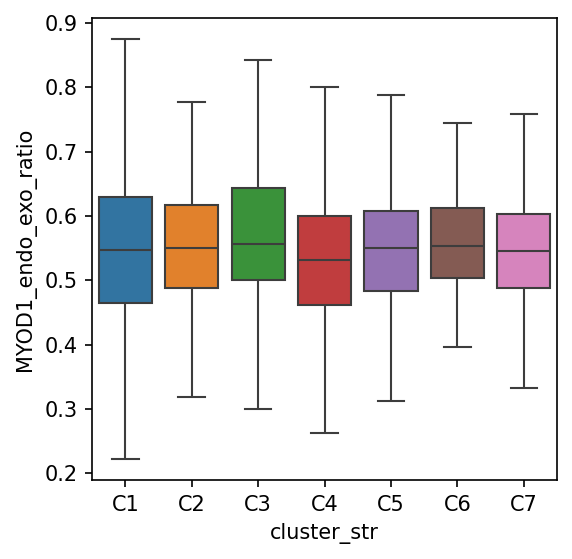

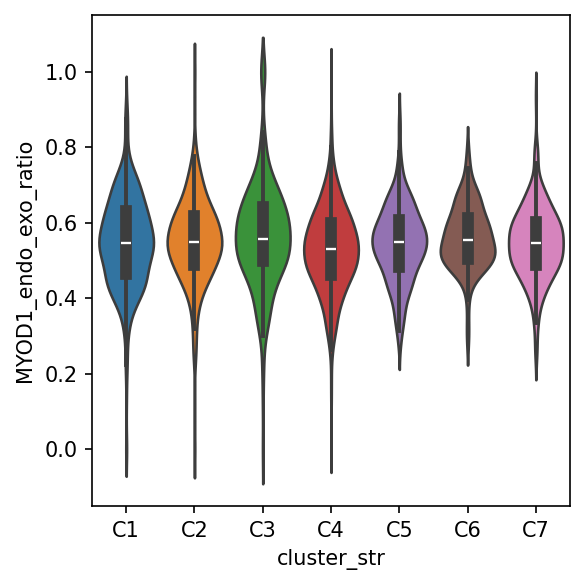

In [93]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

sns.boxplot(
    data=edata.obs,
    x='cluster_str',
    y='MYOD1_endo_exo_ratio',
    hue='cluster_str',
    palette=edata.uns['cluster_str_colors'],
    showfliers=False,
)

plt.show()

sns.violinplot(
    data=edata.obs,
    x='cluster_str',
    y='MYOD1_endo_exo_ratio',
    hue='cluster_str',
    palette=edata.uns['cluster_str_colors'],
    # showfliers=False,
)

plt.tight_layout()
plt.show()

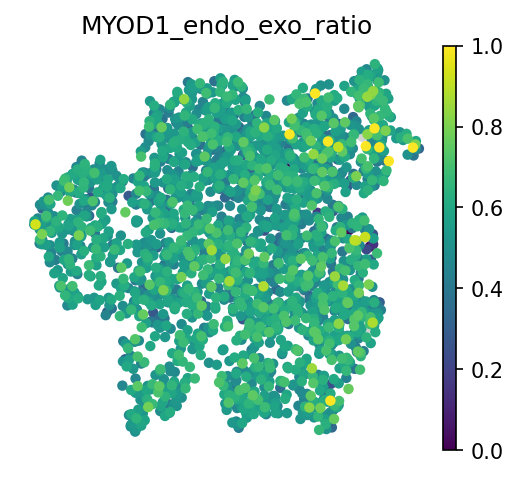

In [91]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 3.5

sc.pl.umap(
    edata,
    color=['MYOD1_endo_exo_ratio'],
    size=100,
    ncols=1,
    frameon=False,
    # alpha=0.8,
    # layer='log_norm',
)

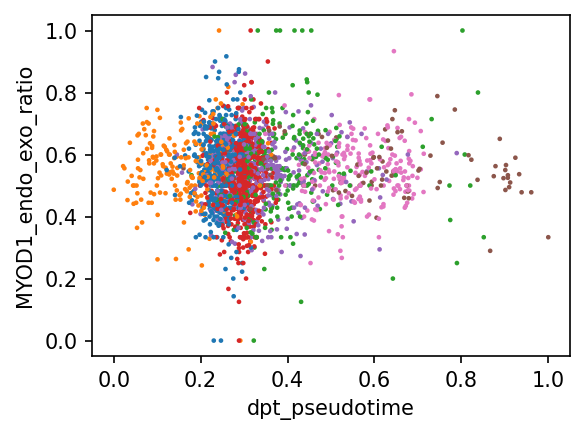

In [73]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 3

sns.scatterplot(
    data=edata.obs,
    x='dpt_pseudotime',
    y='MYOD1_endo_exo_ratio',
    hue='cluster_str',
    palette=edata.uns['cluster_str_colors'],
    edgecolor='none',
    s=5,
    legend=False,
    linewidth=0,
)

plt.tight_layout()
plt.show()

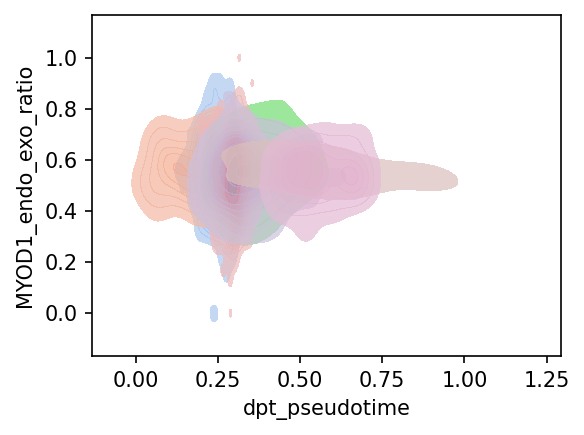

In [75]:
sns.kdeplot(
    data=edata.obs,
    x='dpt_pseudotime',
    y='MYOD1_endo_exo_ratio',
    hue='cluster_str',
    palette=edata.uns['cluster_str_colors'],
    # edgecolor='none',
    # s=5,
    legend=False,
    linewidths=0.5,
    levels=15,
    fill=True,
    alpha=0.7,
    # linewidth=0,
)

plt.tight_layout()
plt.show()

In [65]:
x = np.arange(len(obs))

pseudotime = obs['dpt_pseudotime'].values
clusters = obs['cluster_str'].values

cluster_categories = obs['cluster_str'].astype('category').cat.categories
cluster_colors = edata.uns['cluster_str_colors']  # adjust key if needed

cluster_color_map = dict(zip(cluster_categories, cluster_colors))
cluster_colors_mapped = [cluster_color_map[c] for c in clusters]

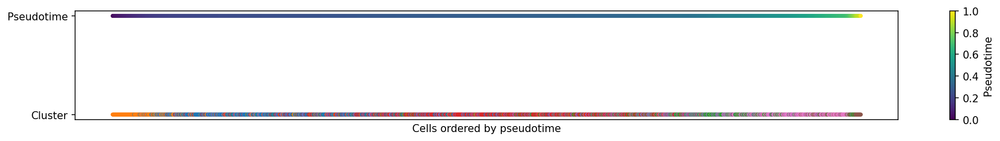

In [68]:
plt.figure(figsize=(15, 2), dpi=150)

# Row 1: pseudotime (continuous colormap)
plt.scatter(
    x,
    np.ones_like(x) * 1,
    c=pseudotime,
    cmap='viridis',
    s=8
)

# Row 2: clusters (categorical colors)
plt.scatter(
    x,
    np.zeros_like(x),
    c=cluster_colors_mapped,
    s=8
)

# formatting
plt.yticks([0, 1], ['Cluster', 'Pseudotime'])
plt.xticks([])  # usually hide x-axis
plt.xlabel('Cells ordered by pseudotime')

# colorbar for pseudotime
cbar = plt.colorbar()
cbar.set_label('Pseudotime')

plt.tight_layout()
plt.show()